In [ ]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load in 

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the "../input/" directory.
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
# for dirname, _, filenames in os.walk('/kaggle/input'):
#     for filename in filenames:
#         print(os.path.join(dirname, filename))

# Any results you write to the current directory are saved as output.

In [ ]:
import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
from torch.utils.data import Dataset, DataLoader
from torchvision import transforms
from torchvision.utils import make_grid
import torchvision.utils as vutils
import matplotlib.animation as animation
from IPython.display import HTML

import matplotlib.pyplot as plt
from PIL import Image
import numpy as np
import pandas as pd
import copy
import time
import cv2 as cv
from tqdm import tqdm_notebook as tqdm
import matplotlib.image as mpimg

import torchvision.transforms.functional as TF

In [ ]:
!pip install opendatasets --upgrade --quiet

In [ ]:
# 1533697a23fb7953f1c0a399557991f3
import opendatasets as od

dataset_url = 'https://www.kaggle.com/datasets/hsankesara/flickr-image-dataset'
od.download(dataset_url, force=True)

Please provide your Kaggle credentials to download this dataset. Learn more: http://bit.ly/kaggle-creds
Your Kaggle username: gajamnithin
Your Kaggle Key: ··········


100%|██████████| 8.16G/8.16G [00:58<00:00, 151MB/s]


In [ ]:
img_dir = '/content/flickr-image-dataset/flickr30k_images/flickr30k_images/flickr30k_images/'
img_list = os.listdir(img_dir)
print(len(img_list))
valid_ratio = 0.8

31783


In [ ]:
class ImageData(Dataset):
    def __init__(self,is_train=True):
        self.is_train = is_train
        self.transform = transforms.Compose([transforms.ToTensor(),])
        self.train_index = int(valid_ratio * len(img_list))
        self.crop = transforms.CenterCrop((218,178))
    def __len__(self):
        if self.is_train:
            return self.train_index
        else:
            return len(img_list) - self.train_index -1
    def __getitem__(self, index):
        if not self.is_train:
            index = self.train_index + index
        img = mpimg.imread(img_dir+img_list[index])
        img = self.crop(TF.to_pil_image(img))
        img = self.transform(img)
        img = (img-0.5) /0.5
        return img

In [ ]:
batch_size=10
dataset = ImageData()
dataloader = DataLoader(dataset, batch_size=batch_size, shuffle=True)
device = 'cuda'

torch.Size([3, 218, 178])


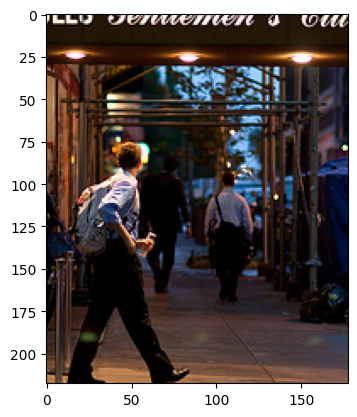

In [ ]:
a = next(iter(dataloader))
print(a[0].shape)
img = a[5]
img = img *0.5 + 0.5
plt.imshow(img.permute(1,2,0))

In [ ]:
# custom weights initialization called on netG and netD
def weights_init(m):
    classname = m.__class__.__name__
    if classname.find('Conv') != -1:
        nn.init.normal_(m.weight.data, 0.0, 0.02)
    elif classname.find('BatchNorm') != -1:
        nn.init.normal_(m.weight.data, 1.0, 0.02)
        nn.init.constant_(m.bias.data, 0)

In [ ]:
IMG_WIDTH = 178
IMG_HEIGHT = 218
latent_size = 200

num_channels_in_encoder = 40

In [ ]:
# Encoder Model
class Encoder(nn.Module):
    def __init__(self):
        super(Encoder, self).__init__()
        
        # ENCODER

        # 64x64x64
        self.e_conv_1 = nn.Sequential(
            nn.ZeroPad2d((1, 2, 1, 2)),
            nn.Conv2d(in_channels=3, out_channels=64, kernel_size=(5, 5), stride=(2, 2)),nn.LeakyReLU()
        )

        # 128x32x32
        self.e_conv_2 = nn.Sequential(
            nn.ZeroPad2d((1, 2, 1, 2)),
            nn.Conv2d(in_channels=64, out_channels=128, kernel_size=(5, 5), stride=(2, 2)),
            nn.LeakyReLU()
        )
        
        # 128x32x32
        self.e_block_1 = nn.Sequential(
            nn.ZeroPad2d((1, 1, 1, 1)),
            nn.Conv2d(in_channels=128, out_channels=128, kernel_size=(3, 3), stride=(1, 1)),
            nn.LeakyReLU(),

            nn.ZeroPad2d((1, 1, 1, 1)),
            nn.Conv2d(in_channels=128, out_channels=128, kernel_size=(3, 3), stride=(1, 1)),
        )

        # 128x32x32
        self.e_block_2 = nn.Sequential(
            nn.ZeroPad2d((1, 1, 1, 1)),
            nn.Conv2d(in_channels=128, out_channels=128, kernel_size=(3, 3), stride=(1, 1)),
            nn.LeakyReLU(),
            nn.ZeroPad2d((1, 1, 1, 1)),
            nn.Conv2d(in_channels=128, out_channels=128, kernel_size=(3, 3), stride=(1, 1)),
        )

        # 128x32x32
        self.e_block_3 = nn.Sequential(
            nn.ZeroPad2d((1, 1, 1, 1)),
            nn.Conv2d(in_channels=128, out_channels=128, kernel_size=(3, 3), stride=(1, 1)),
            nn.LeakyReLU(),

            nn.ZeroPad2d((1, 1, 1, 1)),
            nn.Conv2d(in_channels=128, out_channels=128, kernel_size=(3, 3), stride=(1, 1)),
        )

        # 32x32x32
        self.e_conv_3 = nn.Sequential(
            nn.Conv2d(in_channels=128, out_channels=num_channels_in_encoder, kernel_size=(5, 5), stride=(1, 1), padding=(2, 2)),
            nn.Tanh()
        )
    def forward(self, x):
        ec1 = self.e_conv_1(x)
        ec2 = self.e_conv_2(ec1)
        eblock1 = self.e_block_1(ec2) + ec2
        eblock2 = self.e_block_2(eblock1) + eblock1
        eblock3 = self.e_block_3(eblock2) + eblock2
        ec3 = self.e_conv_3(eblock3)  # in [-1, 1] from tanh activation
        return ec3

In [ ]:
device

'cuda'

In [ ]:
netE = Encoder().to(device)
netE.apply(weights_init)
inp = torch.randn(IMG_WIDTH*IMG_HEIGHT*3 * 100)
inp = inp.view((-1,3,IMG_HEIGHT,IMG_WIDTH))
output = netE(inp.to(device))
print(output.shape)
print('The Compression Ratio is :  ' + str((output.shape[1]*output.shape[2]*output.shape[3])/(IMG_WIDTH*IMG_HEIGHT*3)))

torch.Size([100, 40, 54, 44])
The Compression Ratio is :  0.8164106793114112


In [ ]:
# Generator / Decoder Model

class Generator(nn.Module):
    def __init__(self):
        super(Generator, self).__init__()
        
        # DECODER

        # 128x64x64
        self.d_up_conv_1 = nn.Sequential(
        nn.Conv2d(in_channels=num_channels_in_encoder, out_channels=64, kernel_size=(3, 3), stride=(1, 1)),
            nn.LeakyReLU(),

            nn.ZeroPad2d((1, 1, 1, 1)),
            nn.ConvTranspose2d(in_channels=64, out_channels=128, kernel_size=(2, 2), stride=(2, 2))
        )

        # 128x64x64
        self.d_block_1 = nn.Sequential(
            nn.ZeroPad2d((1, 1, 1, 1)),
            nn.Conv2d(in_channels=128, out_channels=128, kernel_size=(3, 3), stride=(1, 1)),
            nn.LeakyReLU(),

            nn.ZeroPad2d((1, 1, 1, 1)),
            nn.Conv2d(in_channels=128, out_channels=128, kernel_size=(3, 3), stride=(1, 1)),
        )

        # 128x64x64
        self.d_block_2 = nn.Sequential(
            nn.ZeroPad2d((1, 1, 1, 1)),
            nn.Conv2d(in_channels=128, out_channels=128, kernel_size=(3, 3), stride=(1, 1)),
            nn.LeakyReLU(),

            nn.ZeroPad2d((1, 1, 1, 1)),
            nn.Conv2d(in_channels=128, out_channels=128, kernel_size=(3, 3), stride=(1, 1)),
        )

        # 128x64x64
        self.d_block_3 = nn.Sequential(
            nn.ZeroPad2d((1, 1, 1, 1)),
            nn.Conv2d(in_channels=128, out_channels=128, kernel_size=(3, 3), stride=(1, 1)),
            nn.LeakyReLU(),

            nn.ZeroPad2d((1, 1, 1, 1)),
            nn.Conv2d(in_channels=128, out_channels=128, kernel_size=(3, 3), stride=(1, 1)),
        )

        # 256x128x128
        self.d_up_conv_2 = nn.Sequential(
            nn.Conv2d(in_channels=128, out_channels=32, kernel_size=(3, 3), stride=(1, 1)),
            nn.LeakyReLU(),

            nn.ZeroPad2d((1, 1, 1, 1)),
            nn.ConvTranspose2d(in_channels=32, out_channels=128, kernel_size=(2, 2), stride=(2, 2))
        )

        # 3x128x128
        self.d_up_conv_3 = nn.Sequential(
            nn.Conv2d(in_channels=128, out_channels=16, kernel_size=(3, 3), stride=(1, 1)),
            nn.LeakyReLU(),

            nn.ReflectionPad2d((3, 3, 3, 3)),
            nn.Conv2d(in_channels=16, out_channels=3, kernel_size=(3, 3), stride=(1, 1)),
            nn.Tanh()
        )

        
        
    def forward(self, x):
        uc1 = self.d_up_conv_1(x)
        dblock1 = self.d_block_1(uc1) + uc1
        dblock2 = self.d_block_2(dblock1) + dblock1
        dblock3 = self.d_block_3(dblock2) + dblock2
        uc2 = self.d_up_conv_2(dblock3)
        dec = self.d_up_conv_3(uc2)
        return dec

In [ ]:
netG = Generator().to(device)
netG.apply(weights_init)
inp = torch.randn(100*num_channels_in_encoder*54*44).view((-1,num_channels_in_encoder,54,44)).to(device)
output = netG(inp)
print(output.shape)
#218 * 178

torch.Size([100, 3, 218, 178])


In [ ]:
torch.cuda.empty_cache()

In [ ]:
# Discriminator Model
class Discriminator(nn.Module):
    def __init__(self):
        super(Discriminator, self).__init__()
        self.latent_layer1 = nn.Sequential(
            nn.ConvTranspose2d(num_channels_in_encoder, 12, (3,3), stride=1, padding=0, output_padding=0, groups=1, bias=True, dilation=1),
            nn.LeakyReLU(negative_slope=0.2, inplace=True),
        )
        self.latent_layer2 = nn.Sequential(
            nn.ConvTranspose2d(12, 16, (3,3), stride=1, padding=2, output_padding=0, groups=1, bias=True, dilation=1),
            nn.LeakyReLU(negative_slope=0.2, inplace=True),
        )
        self.latent_layer3 = nn.Sequential(
            nn.ConvTranspose2d(16, 24, (3,3), stride=2, padding=2, output_padding=1, groups=1, bias=True, dilation=1),
            nn.LeakyReLU(negative_slope=0.2, inplace=True),
        )
        self.latent_layer4 = nn.Sequential(
            nn.ConvTranspose2d(24, 36, (5,5), stride=2, padding=0, output_padding=1, groups=1, bias=True, dilation=1),
            nn.LeakyReLU(negative_slope=0.2, inplace=True),
        )
        self.latent_layer5 = nn.Sequential(
            nn.ConvTranspose2d(36, 3, (3,3), stride=1, padding=0, output_padding=0, groups=1, bias=True, dilation=1),
            nn.LeakyReLU(negative_slope=0.2, inplace=True),
            nn.Tanh(),
        )

        
        self.layer1 = nn.Sequential(
            nn.Conv2d(in_channels=6, out_channels=64, kernel_size=3,stride = 1,padding=0),
            nn.LeakyReLU(negative_slope=0.2, inplace=True),
            nn.Dropout(0.3),
        )
        self.layer2 = nn.Sequential(
            nn.Conv2d(in_channels=64, out_channels=128, kernel_size=5,stride = 2,padding=0),
            nn.LeakyReLU(negative_slope=0.2, inplace=True),
            nn.Dropout(0.3),
        )
        self.layer3 = nn.Sequential(
            nn.Conv2d(in_channels=128, out_channels=32, kernel_size=3,stride = 2,padding=2),
            nn.LeakyReLU(negative_slope=0.2, inplace=True),
            nn.Dropout(0.3),
        )
        self.layer4 = nn.Sequential(
            nn.Conv2d(in_channels=32, out_channels=16, kernel_size=3,stride = 1,padding=2),
            nn.LeakyReLU(negative_slope=0.2, inplace=True),
            nn.Dropout(0.3),
        )
        self.layer5 = nn.Sequential(
            nn.Conv2d(in_channels=16, out_channels=8, kernel_size=3,stride = 1,padding=0),
            nn.LeakyReLU(negative_slope=0.2, inplace=True),
            nn.Dropout(0.3),
            nn.Tanh(),
        )
        
        
        self.fc1 = nn.Sequential(
            nn.Linear(8*54*44,2000),
            nn.Sigmoid(),
        )
        
        self.fc2 = nn.Sequential(
            nn.Linear(2000,100),
            nn.Sigmoid(),
        )
        self.fc3 = nn.Sequential(
            nn.Linear(100,1),
            nn.Sigmoid(),
        )
        
        
    def forward(self, x):
        y = x['encoded'].to(device)
        y = self.latent_layer1(y)
        y = self.latent_layer2(y)
        y = self.latent_layer3(y)
        y = self.latent_layer4(y)
        y = self.latent_layer5(y)
#         print(y.shape)
        x = x['img'].to(device)
#         print(x.shape)
        x = torch.cat((x,y),1)
        x = self.layer1(x)
        x = self.layer2(x)
        x = self.layer3(x)
        x = self.layer4(x)
        x = self.layer5(x)
#         print(x.shape)
        x= x.reshape((x.shape[0],-1))
        x = self.fc1(x)
        x = self.fc2(x)
        x = self.fc3(x)
        return x

In [ ]:
netD = Discriminator().to(device)
netD.apply(weights_init)
inp_x = {}
inp_x['img']=torch.randn(IMG_WIDTH*IMG_HEIGHT*3 * 100).view((-1,3,IMG_HEIGHT,IMG_WIDTH))
inp_x['encoded'] = torch.randn(100*num_channels_in_encoder*54*44).view((-1,num_channels_in_encoder,54,44))
output = netD(inp_x)
output.shape

In [ ]:
lr = 0.0002
# Initialize BCELoss function
criterion = nn.BCELoss()
msecriterion = nn.MSELoss()
l1criterion = nn.L1Loss()
# Establish convention for real and fake labels during training
real_label = 1
fake_label = 0

# Setup Adam optimizers for both G and D
optimizerD = optim.Adam(netD.parameters(), lr=lr, betas=(0.5, 0.999))
optimizerG = optim.Adam(netG.parameters(), lr=lr, betas=(0.5, 0.999))
optimizerE = optim.Adam(netE.parameters(), lr=lr, betas=(0.5, 0.999))

In [ ]:
valid_dataset = ImageData(is_train=False)
num_images_to_show = 1
valid_dataloader = DataLoader(valid_dataset, batch_size=num_images_to_show, shuffle=True)
valid_batch = next(iter(valid_dataloader)).to(device)

Starting Training Loop...
[0/5][0/2543]	Loss_D: 1.4262	Loss_G: 2.8345	Loss_E: 2.8389	D(x): 0.3877	D(G(z)): 0.3877 / 0.4585


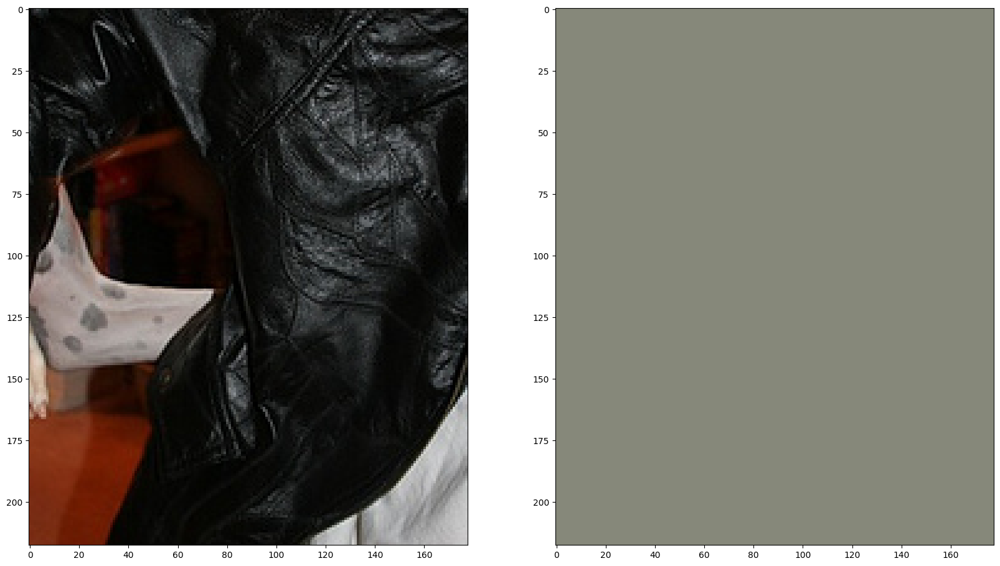

[0/5][50/2543]	Loss_D: 1.3848	Loss_G: 1.7683	Loss_E: 1.7661	D(x): 0.5062	D(G(z)): 0.5048 / 0.4984
[0/5][100/2543]	Loss_D: 1.2242	Loss_G: 2.2468	Loss_E: 2.2252	D(x): 0.5055	D(G(z)): 0.3914 / 0.3669
[0/5][150/2543]	Loss_D: 1.1256	Loss_G: 2.4915	Loss_E: 2.4858	D(x): 0.6411	D(G(z)): 0.4537 / 0.2287
[0/5][200/2543]	Loss_D: 0.8826	Loss_G: 3.1183	Loss_E: 3.0764	D(x): 0.7508	D(G(z)): 0.3604 / 0.2789
[0/5][250/2543]	Loss_D: 1.2720	Loss_G: 1.6800	Loss_E: 1.6817	D(x): 0.5370	D(G(z)): 0.4522 / 0.4430
[0/5][300/2543]	Loss_D: 1.4089	Loss_G: 2.6421	Loss_E: 2.6421	D(x): 0.4902	D(G(z)): 0.5027 / 0.5032
[0/5][350/2543]	Loss_D: 1.3862	Loss_G: 1.9004	Loss_E: 1.9000	D(x): 0.4989	D(G(z)): 0.4987 / 0.5050
[0/5][400/2543]	Loss_D: 1.3861	Loss_G: 1.8166	Loss_E: 1.8172	D(x): 0.5099	D(G(z)): 0.5094 / 0.5064
[0/5][450/2543]	Loss_D: 1.3847	Loss_G: 1.6925	Loss_E: 1.6928	D(x): 0.5081	D(G(z)): 0.5071 / 0.5076
[0/5][500/2543]	Loss_D: 1.3880	Loss_G: 1.5989	Loss_E: 1.5979	D(x): 0.5121	D(G(z)): 0.5130 / 0.5056


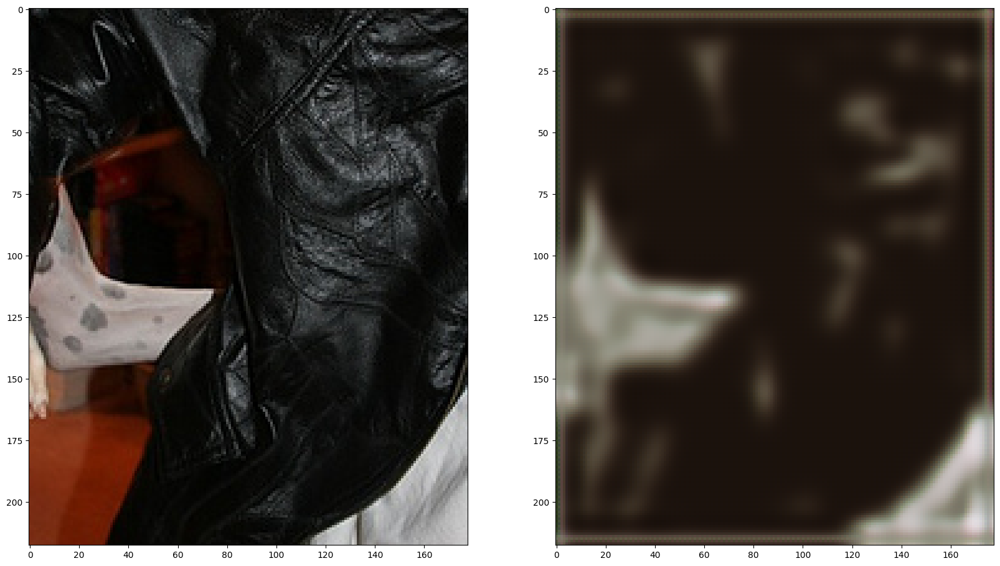

[0/5][550/2543]	Loss_D: 1.3792	Loss_G: 1.7468	Loss_E: 1.7463	D(x): 0.4992	D(G(z)): 0.4946 / 0.5003
[0/5][600/2543]	Loss_D: 1.3734	Loss_G: 1.4392	Loss_E: 1.4407	D(x): 0.4952	D(G(z)): 0.4878 / 0.4840
[0/5][650/2543]	Loss_D: 1.3392	Loss_G: 1.6177	Loss_E: 1.6187	D(x): 0.5437	D(G(z)): 0.5099 / 0.4392
[0/5][700/2543]	Loss_D: 1.2196	Loss_G: 1.7948	Loss_E: 1.7950	D(x): 0.5146	D(G(z)): 0.3926 / 0.4338
[0/5][750/2543]	Loss_D: 1.4737	Loss_G: 1.6049	Loss_E: 1.6081	D(x): 0.4382	D(G(z)): 0.4793 / 0.4905
[0/5][800/2543]	Loss_D: 1.3793	Loss_G: 1.5976	Loss_E: 1.6044	D(x): 0.4897	D(G(z)): 0.4850 / 0.5012
[0/5][850/2543]	Loss_D: 1.3831	Loss_G: 1.4855	Loss_E: 1.4834	D(x): 0.4564	D(G(z)): 0.4517 / 0.4765
[0/5][900/2543]	Loss_D: 1.3346	Loss_G: 1.5901	Loss_E: 1.5861	D(x): 0.5054	D(G(z)): 0.4636 / 0.5013
[0/5][950/2543]	Loss_D: 1.5686	Loss_G: 1.6487	Loss_E: 1.6526	D(x): 0.5268	D(G(z)): 0.5812 / 0.4865
[0/5][1000/2543]	Loss_D: 1.3817	Loss_G: 1.5567	Loss_E: 1.5579	D(x): 0.5002	D(G(z)): 0.4953 / 0.4989


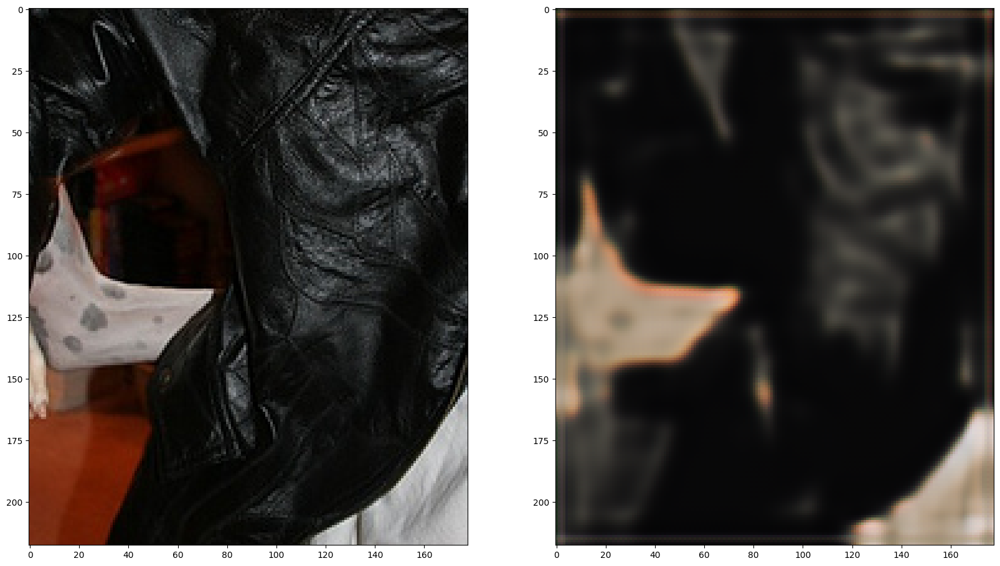

[0/5][1050/2543]	Loss_D: 1.3258	Loss_G: 1.5606	Loss_E: 1.5612	D(x): 0.5280	D(G(z)): 0.4906 / 0.4722
[0/5][1100/2543]	Loss_D: 1.3804	Loss_G: 1.5402	Loss_E: 1.5388	D(x): 0.5153	D(G(z)): 0.5113 / 0.4894
[0/5][1150/2543]	Loss_D: 1.3808	Loss_G: 1.4699	Loss_E: 1.4699	D(x): 0.5198	D(G(z)): 0.5169 / 0.5099
[0/5][1200/2543]	Loss_D: 1.3892	Loss_G: 1.3898	Loss_E: 1.3914	D(x): 0.5844	D(G(z)): 0.5736 / 0.5061
[0/5][1250/2543]	Loss_D: 1.3781	Loss_G: 1.6840	Loss_E: 1.6807	D(x): 0.5051	D(G(z)): 0.4993 / 0.3987
[0/5][1300/2543]	Loss_D: 1.2589	Loss_G: 1.5704	Loss_E: 1.5616	D(x): 0.5887	D(G(z)): 0.5063 / 0.4147
[0/5][1350/2543]	Loss_D: 1.3303	Loss_G: 2.4196	Loss_E: 2.4397	D(x): 0.5829	D(G(z)): 0.5358 / 0.2360
[0/5][1400/2543]	Loss_D: 1.3870	Loss_G: 1.3301	Loss_E: 1.3280	D(x): 0.5047	D(G(z)): 0.5047 / 0.4984
[0/5][1450/2543]	Loss_D: 1.3878	Loss_G: 1.3279	Loss_E: 1.3280	D(x): 0.5029	D(G(z)): 0.5033 / 0.4992
[0/5][1500/2543]	Loss_D: 1.3853	Loss_G: 1.3530	Loss_E: 1.3525	D(x): 0.5041	D(G(z)): 0.5037 / 0.4988


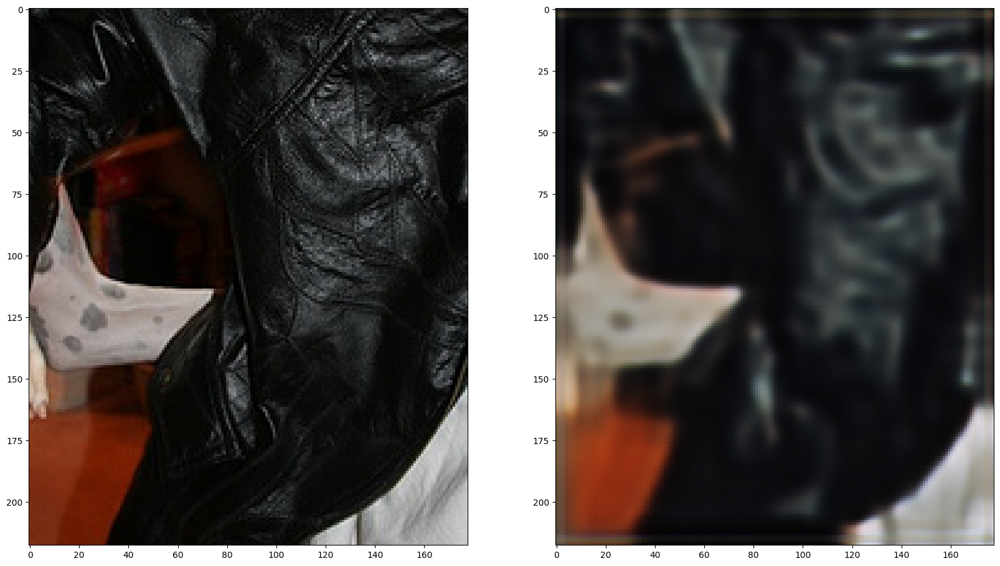

[0/5][1550/2543]	Loss_D: 1.3868	Loss_G: 1.2800	Loss_E: 1.2799	D(x): 0.5086	D(G(z)): 0.5084 / 0.4934
[0/5][1600/2543]	Loss_D: 1.3839	Loss_G: 1.2411	Loss_E: 1.2457	D(x): 0.4830	D(G(z)): 0.4782 / 0.4855
[0/5][1650/2543]	Loss_D: 1.3649	Loss_G: 1.4076	Loss_E: 1.4087	D(x): 0.5106	D(G(z)): 0.4970 / 0.4853
[0/5][1700/2543]	Loss_D: 1.3187	Loss_G: 1.4704	Loss_E: 1.4769	D(x): 0.5686	D(G(z)): 0.5161 / 0.4877
[0/5][1750/2543]	Loss_D: 1.4677	Loss_G: 1.6920	Loss_E: 1.6958	D(x): 0.3944	D(G(z)): 0.4044 / 0.3925
[0/5][1800/2543]	Loss_D: 1.3903	Loss_G: 1.3539	Loss_E: 1.3535	D(x): 0.4982	D(G(z)): 0.5005 / 0.5053
[0/5][1850/2543]	Loss_D: 1.2818	Loss_G: 1.3727	Loss_E: 1.3652	D(x): 0.5385	D(G(z)): 0.4676 / 0.4593
[0/5][1900/2543]	Loss_D: 1.3541	Loss_G: 1.4558	Loss_E: 1.4549	D(x): 0.5434	D(G(z)): 0.5209 / 0.5148
[0/5][1950/2543]	Loss_D: 1.3720	Loss_G: 1.2243	Loss_E: 1.2215	D(x): 0.4989	D(G(z)): 0.4856 / 0.4881
[0/5][2000/2543]	Loss_D: 1.3474	Loss_G: 1.4012	Loss_E: 1.4033	D(x): 0.4528	D(G(z)): 0.4091 / 0.4683


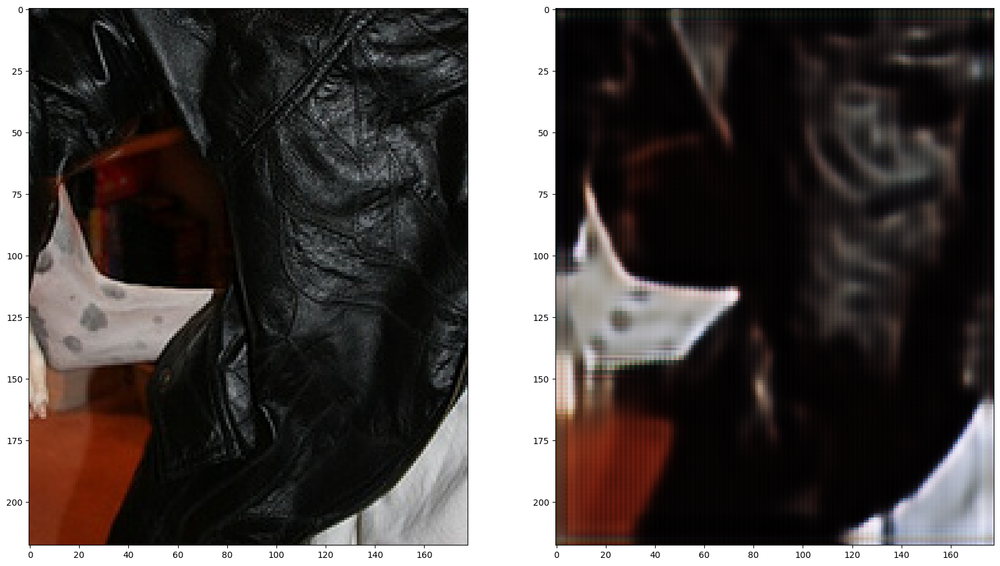

[0/5][2050/2543]	Loss_D: 1.4623	Loss_G: 1.3865	Loss_E: 1.3805	D(x): 0.4532	D(G(z)): 0.4840 / 0.5161
[0/5][2100/2543]	Loss_D: 1.3036	Loss_G: 1.4465	Loss_E: 1.4503	D(x): 0.5458	D(G(z)): 0.4776 / 0.4304
[0/5][2150/2543]	Loss_D: 1.3679	Loss_G: 1.4298	Loss_E: 1.4334	D(x): 0.4577	D(G(z)): 0.4229 / 0.4451
[0/5][2200/2543]	Loss_D: 1.4294	Loss_G: 1.3644	Loss_E: 1.3705	D(x): 0.5006	D(G(z)): 0.5161 / 0.5210
[0/5][2250/2543]	Loss_D: 1.2896	Loss_G: 1.3321	Loss_E: 1.3312	D(x): 0.4996	D(G(z)): 0.4311 / 0.4848
[0/5][2300/2543]	Loss_D: 1.5499	Loss_G: 1.6097	Loss_E: 1.6084	D(x): 0.5078	D(G(z)): 0.5925 / 0.5575
[0/5][2350/2543]	Loss_D: 1.3705	Loss_G: 1.3766	Loss_E: 1.3788	D(x): 0.5696	D(G(z)): 0.5483 / 0.4962
[0/5][2400/2543]	Loss_D: 1.3590	Loss_G: 1.4148	Loss_E: 1.4167	D(x): 0.5241	D(G(z)): 0.4975 / 0.4283
[0/5][2450/2543]	Loss_D: 1.4162	Loss_G: 1.4094	Loss_E: 1.4071	D(x): 0.4610	D(G(z)): 0.4696 / 0.4630
[0/5][2500/2543]	Loss_D: 1.3953	Loss_G: 1.3385	Loss_E: 1.3426	D(x): 0.5140	D(G(z)): 0.5132 / 0.5208


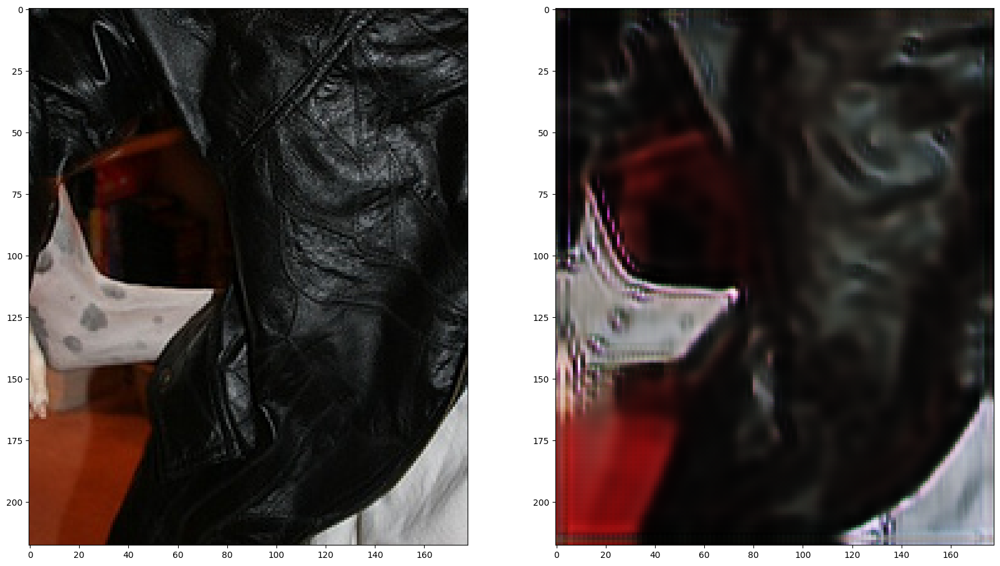

[1/5][0/2543]	Loss_D: 1.3106	Loss_G: 1.4142	Loss_E: 1.4101	D(x): 0.5492	D(G(z)): 0.4998 / 0.4987


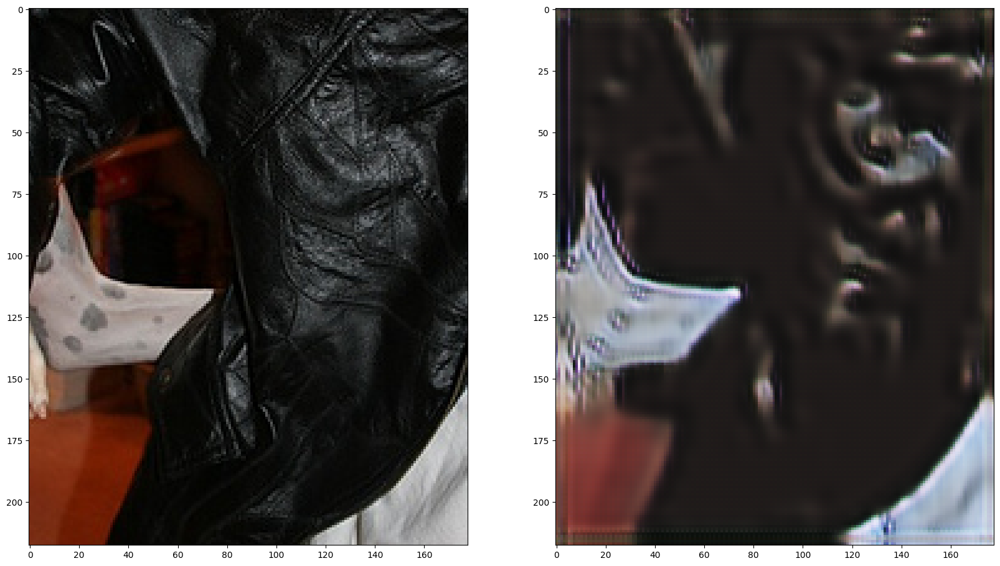

[1/5][50/2543]	Loss_D: 1.3868	Loss_G: 1.3690	Loss_E: 1.3692	D(x): 0.5026	D(G(z)): 0.4937 / 0.4838
[1/5][100/2543]	Loss_D: 1.3000	Loss_G: 1.4162	Loss_E: 1.4176	D(x): 0.5816	D(G(z)): 0.5226 / 0.4905
[1/5][150/2543]	Loss_D: 1.4017	Loss_G: 1.2297	Loss_E: 1.2242	D(x): 0.4754	D(G(z)): 0.4752 / 0.5097
[1/5][200/2543]	Loss_D: 1.4420	Loss_G: 1.2821	Loss_E: 1.2796	D(x): 0.5076	D(G(z)): 0.5343 / 0.5179
[1/5][250/2543]	Loss_D: 1.3518	Loss_G: 1.3994	Loss_E: 1.3997	D(x): 0.5257	D(G(z)): 0.4983 / 0.4789
[1/5][300/2543]	Loss_D: 1.3442	Loss_G: 1.1921	Loss_E: 1.1898	D(x): 0.5056	D(G(z)): 0.4774 / 0.5007
[1/5][350/2543]	Loss_D: 1.3274	Loss_G: 1.1877	Loss_E: 1.1874	D(x): 0.5348	D(G(z)): 0.4976 / 0.4907
[1/5][400/2543]	Loss_D: 1.3899	Loss_G: 1.4217	Loss_E: 1.4245	D(x): 0.5497	D(G(z)): 0.5416 / 0.4932
[1/5][450/2543]	Loss_D: 1.4112	Loss_G: 1.3687	Loss_E: 1.3679	D(x): 0.5411	D(G(z)): 0.5459 / 0.5232
[1/5][500/2543]	Loss_D: 1.2968	Loss_G: 1.1783	Loss_E: 1.1787	D(x): 0.5628	D(G(z)): 0.5010 / 0.5233


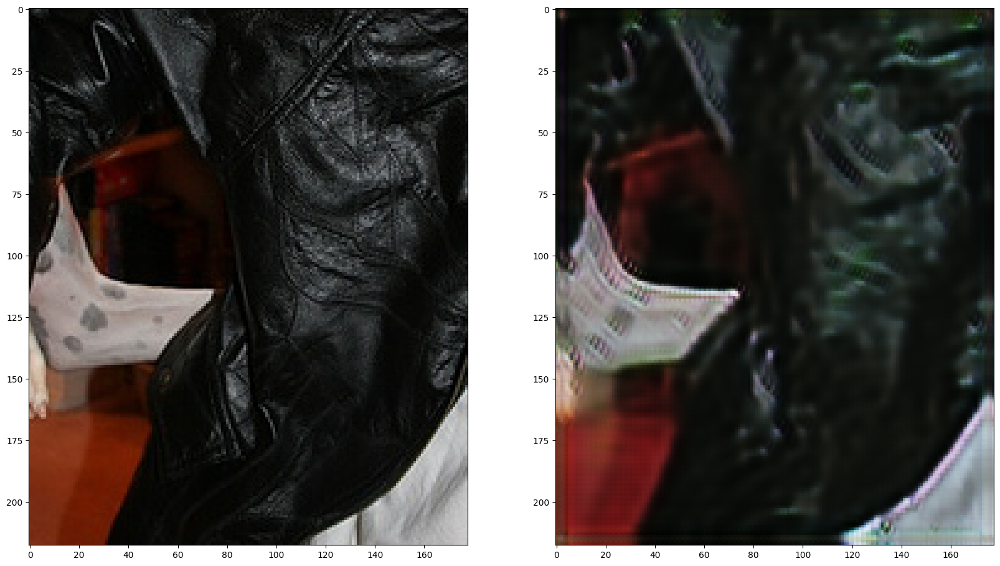

[1/5][550/2543]	Loss_D: 1.4126	Loss_G: 1.3946	Loss_E: 1.3968	D(x): 0.4440	D(G(z)): 0.4430 / 0.4760
[1/5][600/2543]	Loss_D: 1.3696	Loss_G: 1.3076	Loss_E: 1.3069	D(x): 0.4761	D(G(z)): 0.4597 / 0.4573
[1/5][650/2543]	Loss_D: 1.4114	Loss_G: 1.4033	Loss_E: 1.3995	D(x): 0.4144	D(G(z)): 0.4107 / 0.4318
[1/5][700/2543]	Loss_D: 1.3523	Loss_G: 1.2199	Loss_E: 1.2197	D(x): 0.5271	D(G(z)): 0.4947 / 0.4811
[1/5][750/2543]	Loss_D: 1.3408	Loss_G: 1.4200	Loss_E: 1.4174	D(x): 0.5017	D(G(z)): 0.4616 / 0.4483
[1/5][800/2543]	Loss_D: 1.3246	Loss_G: 1.2451	Loss_E: 1.2472	D(x): 0.5698	D(G(z)): 0.5173 / 0.4726
[1/5][850/2543]	Loss_D: 1.3896	Loss_G: 1.2274	Loss_E: 1.2303	D(x): 0.4566	D(G(z)): 0.4520 / 0.4605
[1/5][900/2543]	Loss_D: 1.3725	Loss_G: 1.2787	Loss_E: 1.2834	D(x): 0.4831	D(G(z)): 0.4683 / 0.4619
[1/5][950/2543]	Loss_D: 1.3994	Loss_G: 1.3340	Loss_E: 1.3350	D(x): 0.4947	D(G(z)): 0.4884 / 0.4495
[1/5][1000/2543]	Loss_D: 1.3831	Loss_G: 1.2091	Loss_E: 1.2075	D(x): 0.5137	D(G(z)): 0.5072 / 0.4952


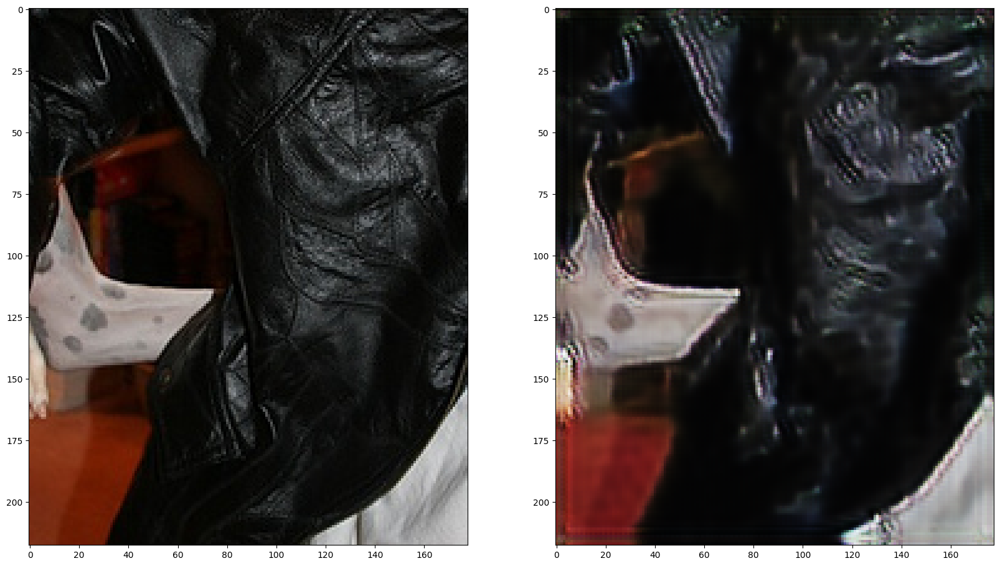

[1/5][1050/2543]	Loss_D: 1.3625	Loss_G: 1.2461	Loss_E: 1.2453	D(x): 0.4625	D(G(z)): 0.4371 / 0.4553
[1/5][1100/2543]	Loss_D: 1.4873	Loss_G: 1.2822	Loss_E: 1.2787	D(x): 0.5162	D(G(z)): 0.5525 / 0.4769
[1/5][1150/2543]	Loss_D: 1.2976	Loss_G: 1.0801	Loss_E: 1.0758	D(x): 0.5377	D(G(z)): 0.4865 / 0.5418
[1/5][1200/2543]	Loss_D: 1.4371	Loss_G: 1.2343	Loss_E: 1.2382	D(x): 0.5109	D(G(z)): 0.5275 / 0.5104
[1/5][1250/2543]	Loss_D: 1.3839	Loss_G: 1.1260	Loss_E: 1.1226	D(x): 0.5277	D(G(z)): 0.5073 / 0.4996
[1/5][1300/2543]	Loss_D: 1.2856	Loss_G: 1.2891	Loss_E: 1.2847	D(x): 0.5631	D(G(z)): 0.4938 / 0.4869
[1/5][1350/2543]	Loss_D: 1.3817	Loss_G: 1.2753	Loss_E: 1.2735	D(x): 0.4449	D(G(z)): 0.4362 / 0.4470
[1/5][1400/2543]	Loss_D: 1.3979	Loss_G: 1.2213	Loss_E: 1.2196	D(x): 0.5668	D(G(z)): 0.5612 / 0.5410
[1/5][1450/2543]	Loss_D: 1.4182	Loss_G: 1.2843	Loss_E: 1.2831	D(x): 0.5297	D(G(z)): 0.5331 / 0.5013
[1/5][1500/2543]	Loss_D: 1.3995	Loss_G: 1.3249	Loss_E: 1.3278	D(x): 0.4960	D(G(z)): 0.4940 / 0.4788


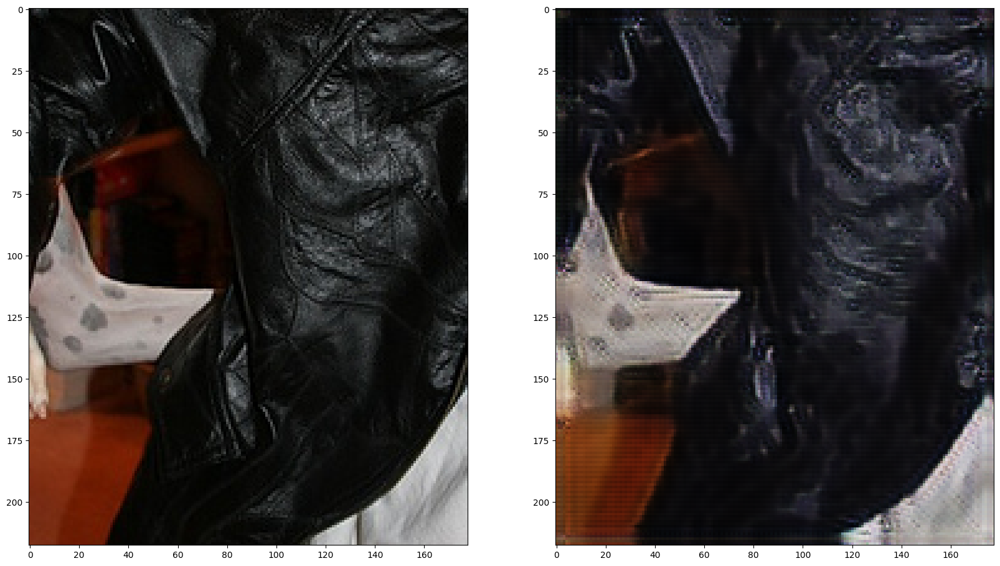

[1/5][1550/2543]	Loss_D: 1.4343	Loss_G: 1.4174	Loss_E: 1.4213	D(x): 0.5194	D(G(z)): 0.5310 / 0.4981
[1/5][1600/2543]	Loss_D: 1.3491	Loss_G: 1.2392	Loss_E: 1.2374	D(x): 0.5218	D(G(z)): 0.4904 / 0.4828
[1/5][1650/2543]	Loss_D: 1.3670	Loss_G: 1.2045	Loss_E: 1.2077	D(x): 0.4674	D(G(z)): 0.4500 / 0.4594
[1/5][1700/2543]	Loss_D: 1.3386	Loss_G: 1.2178	Loss_E: 1.2137	D(x): 0.5392	D(G(z)): 0.4958 / 0.4766
[1/5][1750/2543]	Loss_D: 1.4431	Loss_G: 1.3641	Loss_E: 1.3634	D(x): 0.5557	D(G(z)): 0.5576 / 0.4958
[1/5][1800/2543]	Loss_D: 1.3882	Loss_G: 1.2702	Loss_E: 1.2709	D(x): 0.5281	D(G(z)): 0.5231 / 0.5113
[1/5][1850/2543]	Loss_D: 1.3645	Loss_G: 1.3229	Loss_E: 1.3297	D(x): 0.4866	D(G(z)): 0.4639 / 0.4696
[1/5][1900/2543]	Loss_D: 1.3652	Loss_G: 1.2460	Loss_E: 1.2398	D(x): 0.4967	D(G(z)): 0.4799 / 0.4746
[1/5][1950/2543]	Loss_D: 1.4064	Loss_G: 1.2389	Loss_E: 1.2331	D(x): 0.4418	D(G(z)): 0.4394 / 0.4456
[1/5][2000/2543]	Loss_D: 1.3342	Loss_G: 1.1815	Loss_E: 1.1826	D(x): 0.5065	D(G(z)): 0.4752 / 0.4850


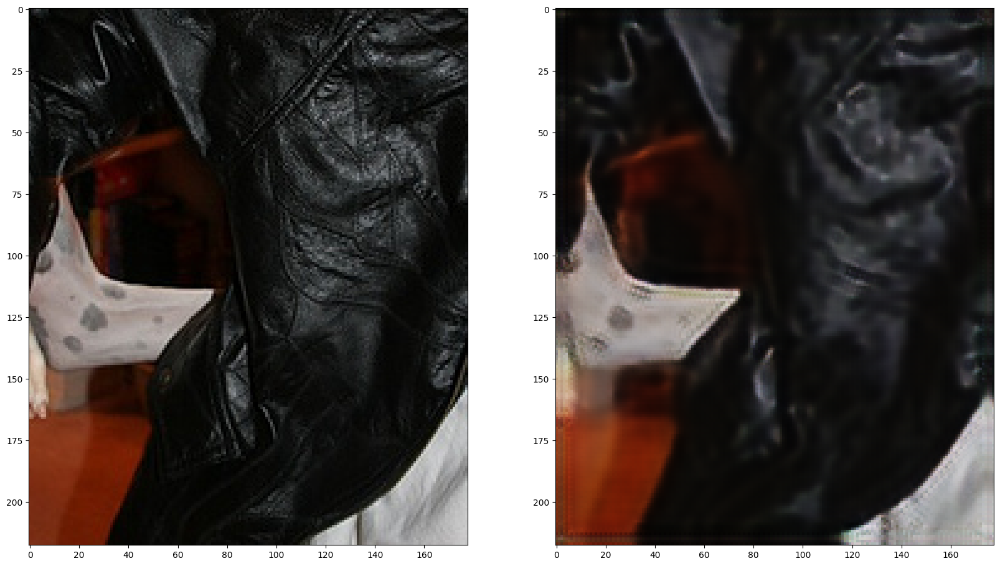

[1/5][2050/2543]	Loss_D: 1.3420	Loss_G: 1.2010	Loss_E: 1.2041	D(x): 0.4767	D(G(z)): 0.4438 / 0.4563
[1/5][2100/2543]	Loss_D: 1.4549	Loss_G: 1.2282	Loss_E: 1.2250	D(x): 0.4808	D(G(z)): 0.5116 / 0.4942
[1/5][2150/2543]	Loss_D: 1.4585	Loss_G: 1.2645	Loss_E: 1.2592	D(x): 0.5191	D(G(z)): 0.5420 / 0.4988
[1/5][2200/2543]	Loss_D: 1.3214	Loss_G: 1.1513	Loss_E: 1.1495	D(x): 0.5652	D(G(z)): 0.5167 / 0.5093
[1/5][2250/2543]	Loss_D: 1.3603	Loss_G: 1.0725	Loss_E: 1.0698	D(x): 0.4869	D(G(z)): 0.4698 / 0.4795
[1/5][2300/2543]	Loss_D: 1.3501	Loss_G: 1.1217	Loss_E: 1.1264	D(x): 0.4918	D(G(z)): 0.4665 / 0.4789
[1/5][2350/2543]	Loss_D: 1.3519	Loss_G: 1.2091	Loss_E: 1.2106	D(x): 0.4831	D(G(z)): 0.4559 / 0.4648
[1/5][2400/2543]	Loss_D: 1.3718	Loss_G: 1.1399	Loss_E: 1.1404	D(x): 0.4627	D(G(z)): 0.4496 / 0.4582
[1/5][2450/2543]	Loss_D: 1.3633	Loss_G: 1.1887	Loss_E: 1.1859	D(x): 0.4649	D(G(z)): 0.4418 / 0.4679
[1/5][2500/2543]	Loss_D: 1.2840	Loss_G: 1.1012	Loss_E: 1.0956	D(x): 0.5607	D(G(z)): 0.4998 / 0.5185


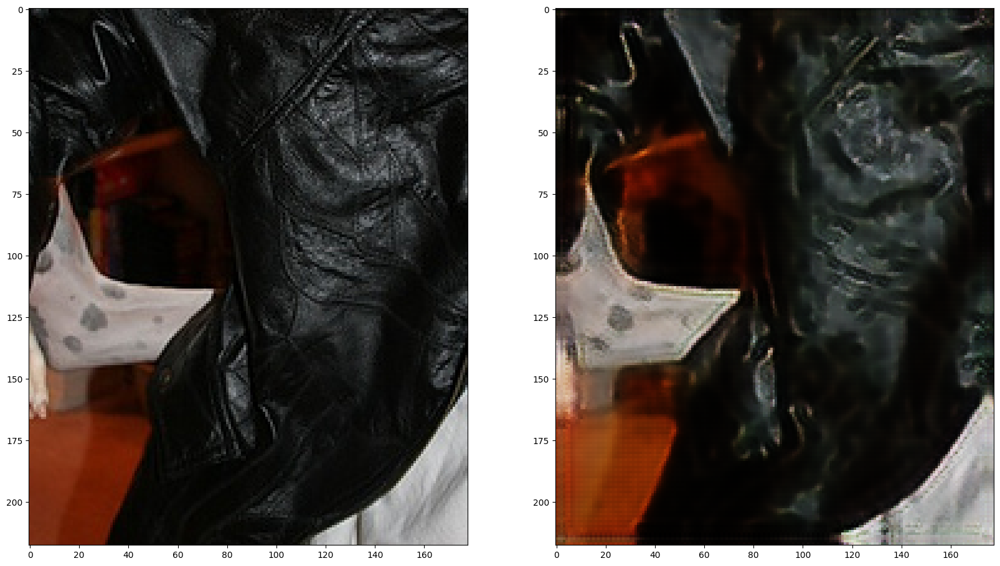

[2/5][0/2543]	Loss_D: 1.3610	Loss_G: 1.1501	Loss_E: 1.1478	D(x): 0.4989	D(G(z)): 0.4759 / 0.4850


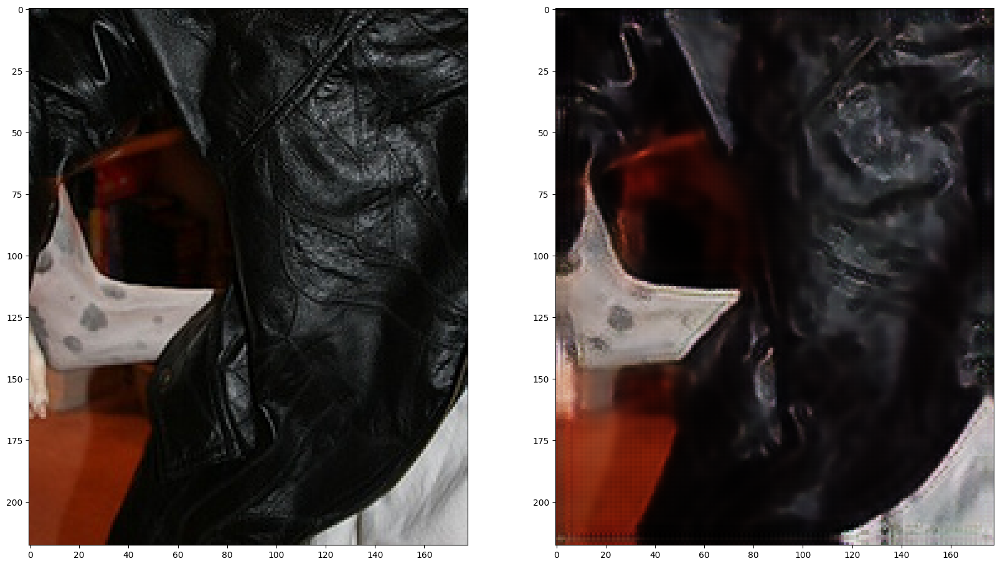

[2/5][50/2543]	Loss_D: 1.3750	Loss_G: 1.2008	Loss_E: 1.1964	D(x): 0.5580	D(G(z)): 0.5274 / 0.5104
[2/5][100/2543]	Loss_D: 1.3001	Loss_G: 1.1119	Loss_E: 1.1193	D(x): 0.5603	D(G(z)): 0.4997 / 0.5078
[2/5][150/2543]	Loss_D: 1.3154	Loss_G: 1.0987	Loss_E: 1.0985	D(x): 0.5367	D(G(z)): 0.4876 / 0.4923
[2/5][200/2543]	Loss_D: 1.3563	Loss_G: 1.1419	Loss_E: 1.1450	D(x): 0.4798	D(G(z)): 0.4510 / 0.4604
[2/5][250/2543]	Loss_D: 1.3901	Loss_G: 1.2561	Loss_E: 1.2611	D(x): 0.5075	D(G(z)): 0.5031 / 0.4739
[2/5][300/2543]	Loss_D: 1.2966	Loss_G: 1.0672	Loss_E: 1.0565	D(x): 0.6012	D(G(z)): 0.5281 / 0.5168
[2/5][350/2543]	Loss_D: 1.3075	Loss_G: 1.1079	Loss_E: 1.1074	D(x): 0.5280	D(G(z)): 0.4813 / 0.4934
[2/5][400/2543]	Loss_D: 1.3605	Loss_G: 1.0903	Loss_E: 1.0906	D(x): 0.5075	D(G(z)): 0.4922 / 0.4978
[2/5][450/2543]	Loss_D: 1.4673	Loss_G: 1.1958	Loss_E: 1.2036	D(x): 0.5226	D(G(z)): 0.5513 / 0.5105
[2/5][500/2543]	Loss_D: 1.3975	Loss_G: 1.2635	Loss_E: 1.2696	D(x): 0.4940	D(G(z)): 0.4950 / 0.4895


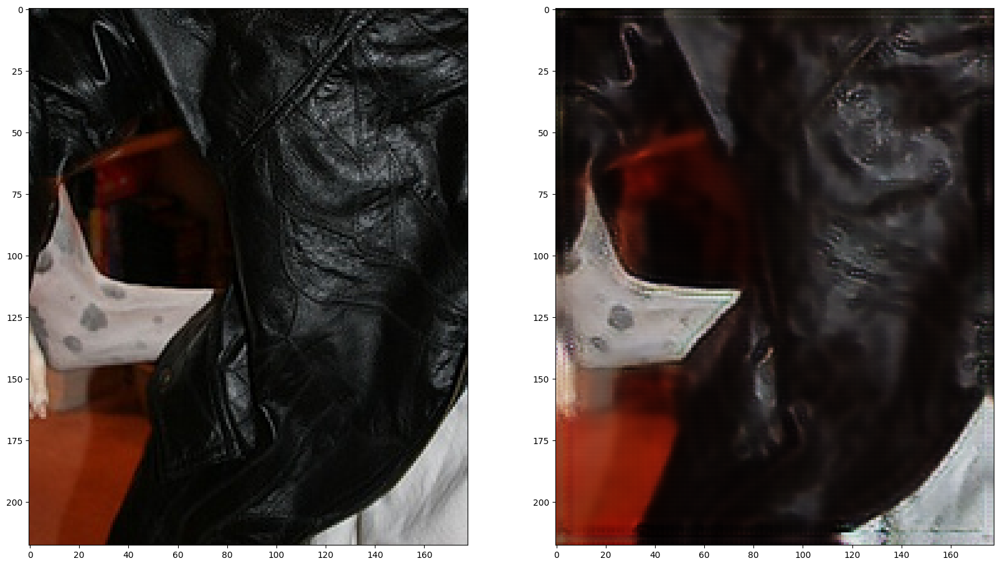

[2/5][550/2543]	Loss_D: 1.4187	Loss_G: 1.0334	Loss_E: 1.0315	D(x): 0.5378	D(G(z)): 0.5459 / 0.5152
[2/5][600/2543]	Loss_D: 1.3835	Loss_G: 1.1913	Loss_E: 1.1924	D(x): 0.4885	D(G(z)): 0.4817 / 0.4858
[2/5][650/2543]	Loss_D: 1.4268	Loss_G: 1.1922	Loss_E: 1.1818	D(x): 0.5052	D(G(z)): 0.5212 / 0.4952
[2/5][700/2543]	Loss_D: 1.4956	Loss_G: 1.2548	Loss_E: 1.2588	D(x): 0.5363	D(G(z)): 0.5638 / 0.5040
[2/5][750/2543]	Loss_D: 1.3184	Loss_G: 1.0700	Loss_E: 1.0672	D(x): 0.5009	D(G(z)): 0.4544 / 0.4677
[2/5][800/2543]	Loss_D: 1.3926	Loss_G: 1.1807	Loss_E: 1.1818	D(x): 0.5235	D(G(z)): 0.5176 / 0.5048
[2/5][850/2543]	Loss_D: 1.3096	Loss_G: 1.0650	Loss_E: 1.0645	D(x): 0.5330	D(G(z)): 0.4814 / 0.5029
[2/5][900/2543]	Loss_D: 1.3973	Loss_G: 1.2648	Loss_E: 1.2676	D(x): 0.4806	D(G(z)): 0.4787 / 0.4717
[2/5][950/2543]	Loss_D: 1.4459	Loss_G: 1.2623	Loss_E: 1.2625	D(x): 0.4473	D(G(z)): 0.4768 / 0.4470
[2/5][1000/2543]	Loss_D: 1.3521	Loss_G: 1.1434	Loss_E: 1.1400	D(x): 0.4994	D(G(z)): 0.4756 / 0.4805


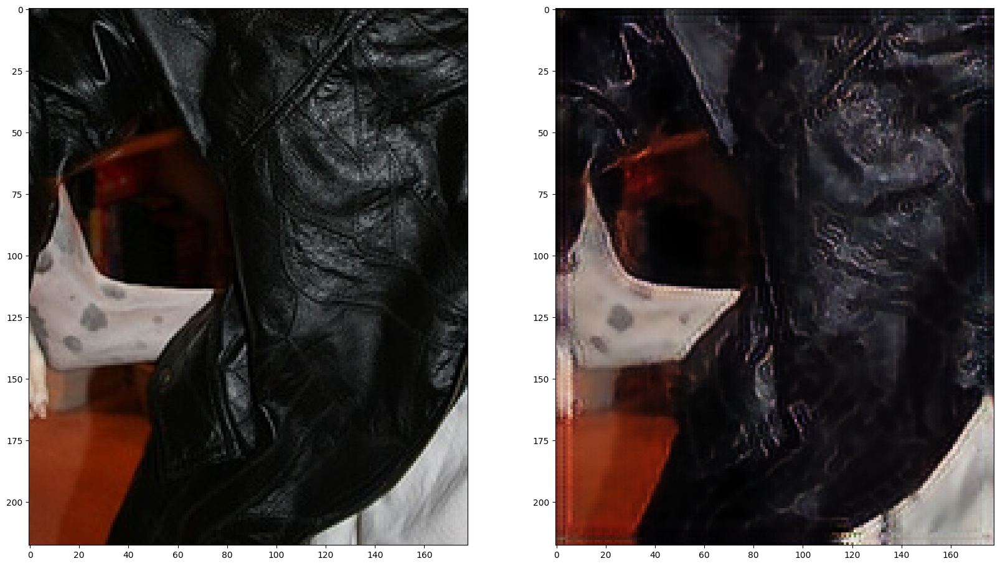

[2/5][1050/2543]	Loss_D: 1.3093	Loss_G: 1.1493	Loss_E: 1.1527	D(x): 0.5279	D(G(z)): 0.4785 / 0.4855
[2/5][1100/2543]	Loss_D: 1.3126	Loss_G: 1.1887	Loss_E: 1.1936	D(x): 0.5181	D(G(z)): 0.4647 / 0.4679
[2/5][1150/2543]	Loss_D: 1.4220	Loss_G: 1.2071	Loss_E: 1.2067	D(x): 0.4847	D(G(z)): 0.5017 / 0.4802
[2/5][1200/2543]	Loss_D: 1.4005	Loss_G: 1.0924	Loss_E: 1.0916	D(x): 0.5199	D(G(z)): 0.5194 / 0.5213
[2/5][1250/2543]	Loss_D: 1.3964	Loss_G: 1.0891	Loss_E: 1.0916	D(x): 0.4944	D(G(z)): 0.4989 / 0.4809
[2/5][1300/2543]	Loss_D: 1.3657	Loss_G: 1.1438	Loss_E: 1.1423	D(x): 0.4958	D(G(z)): 0.4813 / 0.4866
[2/5][1350/2543]	Loss_D: 1.3785	Loss_G: 1.0654	Loss_E: 1.0639	D(x): 0.4737	D(G(z)): 0.4658 / 0.4707
[2/5][1400/2543]	Loss_D: 1.3789	Loss_G: 1.1612	Loss_E: 1.1567	D(x): 0.4715	D(G(z)): 0.4596 / 0.4543
[2/5][1450/2543]	Loss_D: 1.3744	Loss_G: 1.1140	Loss_E: 1.1079	D(x): 0.4874	D(G(z)): 0.4769 / 0.4787
[2/5][1500/2543]	Loss_D: 1.3707	Loss_G: 1.0521	Loss_E: 1.0511	D(x): 0.5930	D(G(z)): 0.5542 / 0.5059


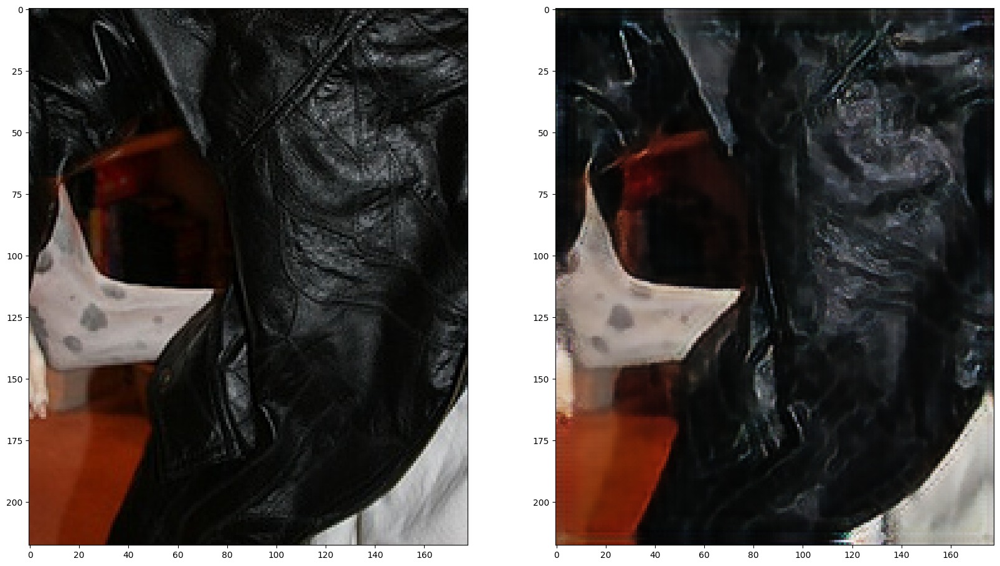

[2/5][1550/2543]	Loss_D: 1.3896	Loss_G: 1.0931	Loss_E: 1.0862	D(x): 0.5160	D(G(z)): 0.5153 / 0.5170
[2/5][1600/2543]	Loss_D: 1.4495	Loss_G: 1.1501	Loss_E: 1.1550	D(x): 0.4931	D(G(z)): 0.5226 / 0.4918
[2/5][1650/2543]	Loss_D: 1.3520	Loss_G: 1.1789	Loss_E: 1.1770	D(x): 0.5185	D(G(z)): 0.4946 / 0.4718
[2/5][1700/2543]	Loss_D: 1.3413	Loss_G: 1.0894	Loss_E: 1.0879	D(x): 0.5120	D(G(z)): 0.4837 / 0.4847
[2/5][1750/2543]	Loss_D: 1.3952	Loss_G: 1.1043	Loss_E: 1.1024	D(x): 0.4581	D(G(z)): 0.4578 / 0.4591
[2/5][1800/2543]	Loss_D: 1.3299	Loss_G: 1.1427	Loss_E: 1.1405	D(x): 0.5254	D(G(z)): 0.4874 / 0.5215
[2/5][1850/2543]	Loss_D: 1.4349	Loss_G: 1.1080	Loss_E: 1.1234	D(x): 0.5515	D(G(z)): 0.5548 / 0.5034
[2/5][1900/2543]	Loss_D: 1.4101	Loss_G: 1.2764	Loss_E: 1.2704	D(x): 0.4648	D(G(z)): 0.4689 / 0.4727
[2/5][1950/2543]	Loss_D: 1.3929	Loss_G: 1.2351	Loss_E: 1.2537	D(x): 0.4926	D(G(z)): 0.4948 / 0.4777
[2/5][2000/2543]	Loss_D: 1.3706	Loss_G: 1.1070	Loss_E: 1.1067	D(x): 0.4715	D(G(z)): 0.4585 / 0.4730


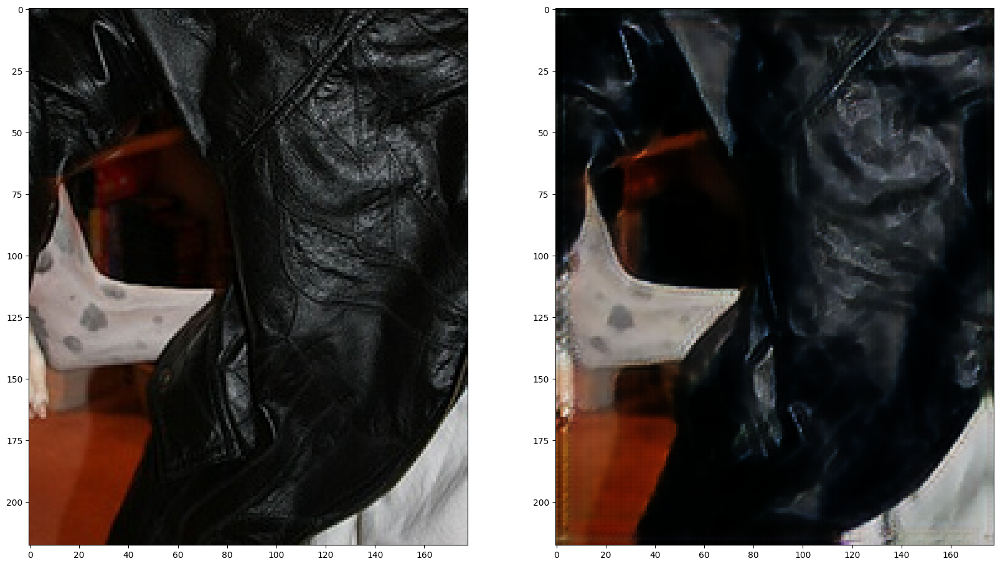

[2/5][2050/2543]	Loss_D: 1.3564	Loss_G: 1.0848	Loss_E: 1.0842	D(x): 0.5013	D(G(z)): 0.4818 / 0.4857
[2/5][2100/2543]	Loss_D: 1.3660	Loss_G: 1.1228	Loss_E: 1.1220	D(x): 0.5955	D(G(z)): 0.5672 / 0.5631
[2/5][2150/2543]	Loss_D: 1.3847	Loss_G: 1.0833	Loss_E: 1.0845	D(x): 0.4557	D(G(z)): 0.4512 / 0.4571
[2/5][2200/2543]	Loss_D: 1.3697	Loss_G: 1.0216	Loss_E: 1.0234	D(x): 0.4744	D(G(z)): 0.4582 / 0.4649
[2/5][2250/2543]	Loss_D: 1.3962	Loss_G: 1.1202	Loss_E: 1.1190	D(x): 0.5036	D(G(z)): 0.5049 / 0.4885
[2/5][2300/2543]	Loss_D: 1.5119	Loss_G: 1.0419	Loss_E: 1.0424	D(x): 0.4945	D(G(z)): 0.5563 / 0.5351
[2/5][2350/2543]	Loss_D: 1.3693	Loss_G: 1.0900	Loss_E: 1.0865	D(x): 0.4871	D(G(z)): 0.4708 / 0.4813
[2/5][2400/2543]	Loss_D: 1.3727	Loss_G: 1.0875	Loss_E: 1.0874	D(x): 0.5183	D(G(z)): 0.5023 / 0.4946
[2/5][2450/2543]	Loss_D: 1.3970	Loss_G: 1.0566	Loss_E: 1.0430	D(x): 0.4924	D(G(z)): 0.4948 / 0.4719
[2/5][2500/2543]	Loss_D: 1.3558	Loss_G: 1.1288	Loss_E: 1.1289	D(x): 0.5043	D(G(z)): 0.4829 / 0.5062


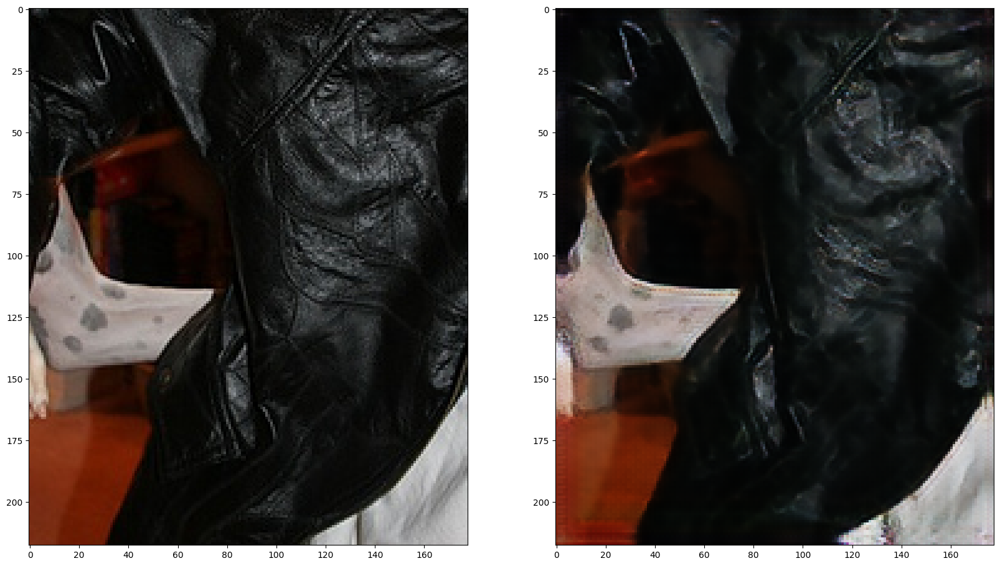

[3/5][0/2543]	Loss_D: 1.3335	Loss_G: 1.1559	Loss_E: 1.1555	D(x): 0.5371	D(G(z)): 0.5010 / 0.4957


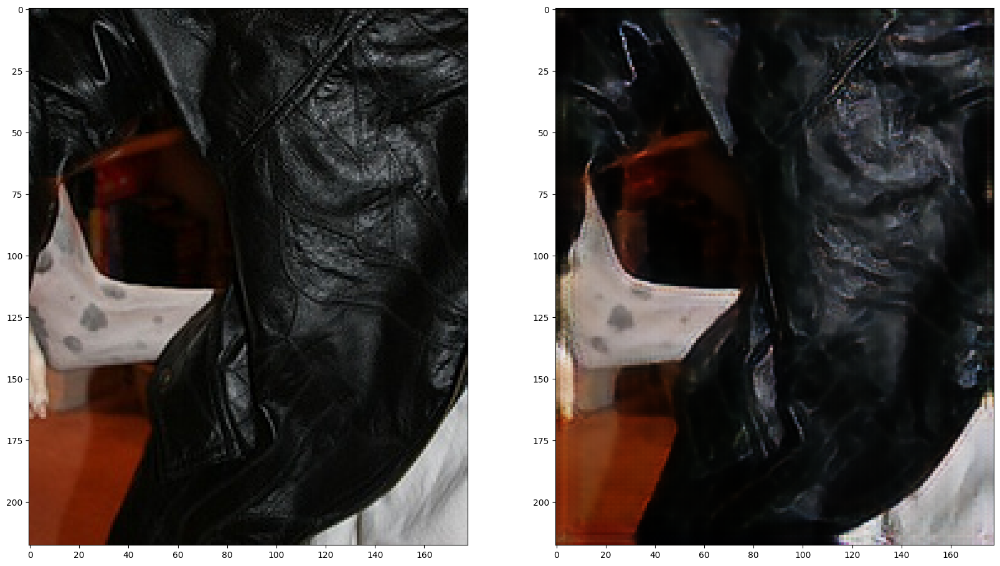

[3/5][50/2543]	Loss_D: 1.3430	Loss_G: 1.1352	Loss_E: 1.1358	D(x): 0.4858	D(G(z)): 0.4587 / 0.4641
[3/5][100/2543]	Loss_D: 1.3618	Loss_G: 1.0865	Loss_E: 1.0808	D(x): 0.5546	D(G(z)): 0.5308 / 0.5185
[3/5][150/2543]	Loss_D: 1.3858	Loss_G: 1.0858	Loss_E: 1.0894	D(x): 0.5130	D(G(z)): 0.5060 / 0.5006
[3/5][200/2543]	Loss_D: 1.3975	Loss_G: 1.1490	Loss_E: 1.1557	D(x): 0.4901	D(G(z)): 0.4933 / 0.4817
[3/5][250/2543]	Loss_D: 1.3740	Loss_G: 1.1467	Loss_E: 1.1480	D(x): 0.5100	D(G(z)): 0.4982 / 0.4959
[3/5][300/2543]	Loss_D: 1.3527	Loss_G: 1.0499	Loss_E: 1.0425	D(x): 0.5108	D(G(z)): 0.4905 / 0.4864
[3/5][350/2543]	Loss_D: 1.3753	Loss_G: 1.1604	Loss_E: 1.1574	D(x): 0.5203	D(G(z)): 0.5000 / 0.4890
[3/5][400/2543]	Loss_D: 1.4250	Loss_G: 1.1847	Loss_E: 1.1841	D(x): 0.4643	D(G(z)): 0.4815 / 0.4665
[3/5][450/2543]	Loss_D: 1.3603	Loss_G: 1.1112	Loss_E: 1.1072	D(x): 0.5121	D(G(z)): 0.4945 / 0.4874
[3/5][500/2543]	Loss_D: 1.3801	Loss_G: 1.0422	Loss_E: 1.0443	D(x): 0.4563	D(G(z)): 0.4484 / 0.4566


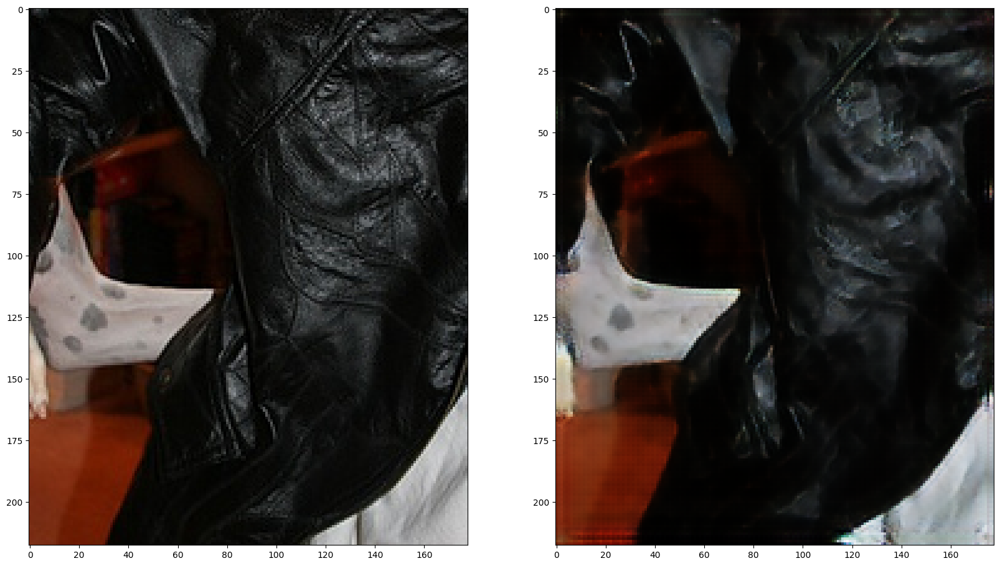

[3/5][550/2543]	Loss_D: 1.3672	Loss_G: 1.0678	Loss_E: 1.0691	D(x): 0.5075	D(G(z)): 0.4957 / 0.4998
[3/5][600/2543]	Loss_D: 1.3791	Loss_G: 1.2465	Loss_E: 1.2503	D(x): 0.4809	D(G(z)): 0.4579 / 0.4556
[3/5][650/2543]	Loss_D: 1.5551	Loss_G: 1.2033	Loss_E: 1.2097	D(x): 0.5584	D(G(z)): 0.6004 / 0.5306
[3/5][700/2543]	Loss_D: 1.4189	Loss_G: 1.1938	Loss_E: 1.1987	D(x): 0.4624	D(G(z)): 0.4783 / 0.4642
[3/5][750/2543]	Loss_D: 1.4081	Loss_G: 1.1931	Loss_E: 1.2013	D(x): 0.5315	D(G(z)): 0.5337 / 0.5188
[3/5][800/2543]	Loss_D: 1.3488	Loss_G: 1.1467	Loss_E: 1.1435	D(x): 0.4895	D(G(z)): 0.4641 / 0.4698
[3/5][850/2543]	Loss_D: 1.3393	Loss_G: 1.1283	Loss_E: 1.1238	D(x): 0.4965	D(G(z)): 0.4654 / 0.4719
[3/5][900/2543]	Loss_D: 1.3866	Loss_G: 1.1016	Loss_E: 1.0987	D(x): 0.4907	D(G(z)): 0.4861 / 0.5142
[3/5][950/2543]	Loss_D: 1.3544	Loss_G: 1.0976	Loss_E: 1.0888	D(x): 0.5299	D(G(z)): 0.5067 / 0.5038
[3/5][1000/2543]	Loss_D: 1.3608	Loss_G: 1.2006	Loss_E: 1.2014	D(x): 0.4991	D(G(z)): 0.4810 / 0.4883


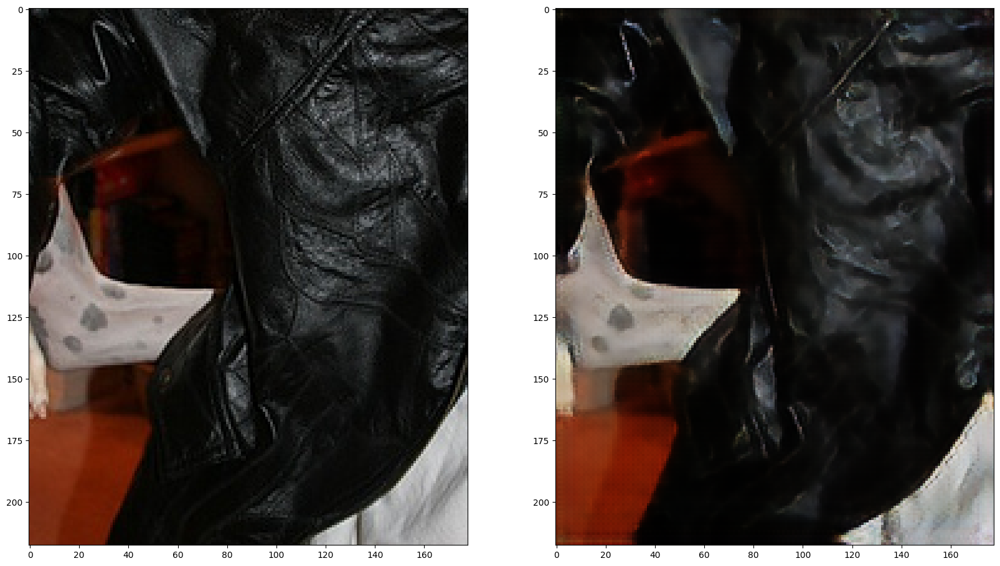

[3/5][1050/2543]	Loss_D: 1.3651	Loss_G: 1.1626	Loss_E: 1.1581	D(x): 0.5075	D(G(z)): 0.4934 / 0.5010
[3/5][1100/2543]	Loss_D: 1.3549	Loss_G: 1.1102	Loss_E: 1.1067	D(x): 0.4955	D(G(z)): 0.4746 / 0.4809
[3/5][1150/2543]	Loss_D: 1.3933	Loss_G: 1.1022	Loss_E: 1.1096	D(x): 0.4487	D(G(z)): 0.4482 / 0.4459
[3/5][1200/2543]	Loss_D: 1.4088	Loss_G: 1.1151	Loss_E: 1.1190	D(x): 0.4667	D(G(z)): 0.4754 / 0.4629
[3/5][1250/2543]	Loss_D: 1.3747	Loss_G: 1.0880	Loss_E: 1.0885	D(x): 0.4760	D(G(z)): 0.4647 / 0.4730
[3/5][1300/2543]	Loss_D: 1.3361	Loss_G: 1.1656	Loss_E: 1.1600	D(x): 0.5064	D(G(z)): 0.4752 / 0.4770
[3/5][1350/2543]	Loss_D: 1.3700	Loss_G: 1.0622	Loss_E: 1.0519	D(x): 0.5078	D(G(z)): 0.4915 / 0.4965
[3/5][1400/2543]	Loss_D: 1.3803	Loss_G: 1.1718	Loss_E: 1.1822	D(x): 0.5353	D(G(z)): 0.5238 / 0.4783
[3/5][1450/2543]	Loss_D: 1.3358	Loss_G: 1.0749	Loss_E: 1.0720	D(x): 0.5211	D(G(z)): 0.4905 / 0.4971
[3/5][1500/2543]	Loss_D: 1.3924	Loss_G: 1.1299	Loss_E: 1.1205	D(x): 0.5011	D(G(z)): 0.5025 / 0.4773


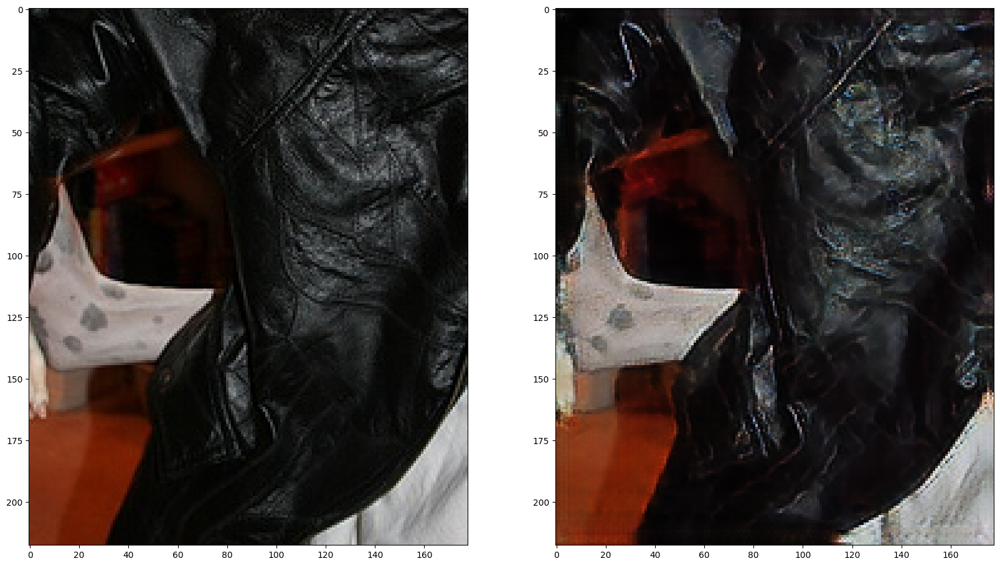

[3/5][1550/2543]	Loss_D: 1.3931	Loss_G: 1.1671	Loss_E: 1.1675	D(x): 0.5377	D(G(z)): 0.5378 / 0.5203
[3/5][1600/2543]	Loss_D: 1.3772	Loss_G: 1.1389	Loss_E: 1.1395	D(x): 0.4867	D(G(z)): 0.4789 / 0.4796
[3/5][1650/2543]	Loss_D: 1.3699	Loss_G: 1.0798	Loss_E: 1.0726	D(x): 0.5838	D(G(z)): 0.5584 / 0.5194
[3/5][1700/2543]	Loss_D: 1.3639	Loss_G: 1.0524	Loss_E: 1.0520	D(x): 0.5366	D(G(z)): 0.5078 / 0.5218
[3/5][1750/2543]	Loss_D: 1.3533	Loss_G: 1.0489	Loss_E: 1.0543	D(x): 0.4953	D(G(z)): 0.4760 / 0.4899
[3/5][1800/2543]	Loss_D: 1.3689	Loss_G: 1.0014	Loss_E: 1.0045	D(x): 0.4796	D(G(z)): 0.4649 / 0.4823
[3/5][1850/2543]	Loss_D: 1.3816	Loss_G: 1.1358	Loss_E: 1.1362	D(x): 0.5395	D(G(z)): 0.5284 / 0.5042
[3/5][1900/2543]	Loss_D: 1.3513	Loss_G: 1.0991	Loss_E: 1.0914	D(x): 0.5103	D(G(z)): 0.4883 / 0.4992
[3/5][1950/2543]	Loss_D: 1.3640	Loss_G: 1.0745	Loss_E: 1.0811	D(x): 0.5188	D(G(z)): 0.4988 / 0.5137
[3/5][2000/2543]	Loss_D: 1.3853	Loss_G: 1.0431	Loss_E: 1.0475	D(x): 0.5210	D(G(z)): 0.5144 / 0.5192


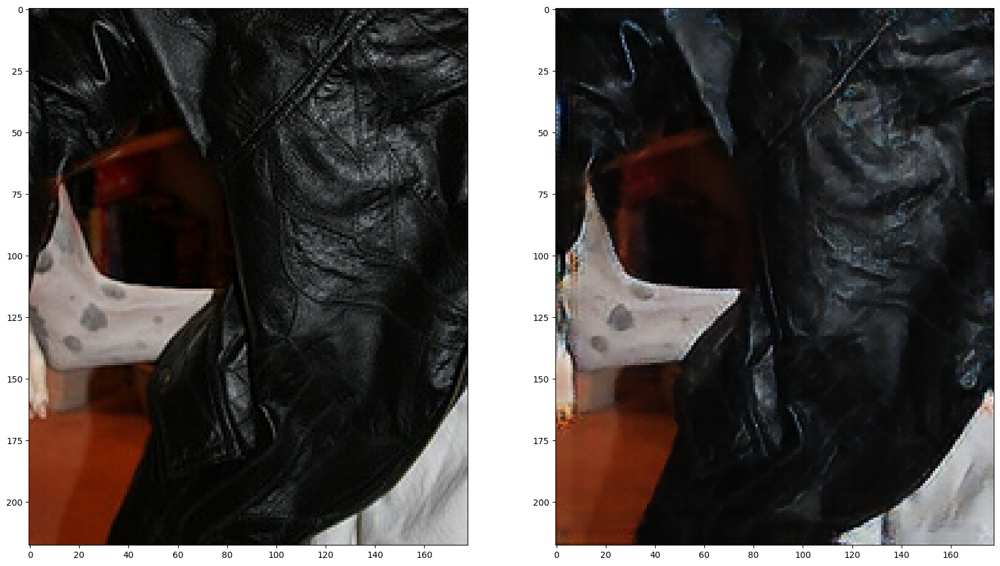

[3/5][2050/2543]	Loss_D: 1.3749	Loss_G: 1.0679	Loss_E: 1.0658	D(x): 0.4919	D(G(z)): 0.4822 / 0.4866
[3/5][2100/2543]	Loss_D: 1.3340	Loss_G: 1.1813	Loss_E: 1.1767	D(x): 0.5065	D(G(z)): 0.4712 / 0.4712
[3/5][2150/2543]	Loss_D: 1.3738	Loss_G: 1.0448	Loss_E: 1.0465	D(x): 0.5192	D(G(z)): 0.5097 / 0.4824
[3/5][2200/2543]	Loss_D: 1.4130	Loss_G: 1.0613	Loss_E: 1.0591	D(x): 0.4844	D(G(z)): 0.4984 / 0.4749
[3/5][2250/2543]	Loss_D: 1.3589	Loss_G: 1.1617	Loss_E: 1.1541	D(x): 0.4836	D(G(z)): 0.4672 / 0.4582
[3/5][2300/2543]	Loss_D: 1.3288	Loss_G: 1.0610	Loss_E: 1.0641	D(x): 0.5294	D(G(z)): 0.4969 / 0.5152
[3/5][2350/2543]	Loss_D: 1.3402	Loss_G: 1.0617	Loss_E: 1.0671	D(x): 0.5143	D(G(z)): 0.4838 / 0.4920
[3/5][2400/2543]	Loss_D: 1.4174	Loss_G: 1.1174	Loss_E: 1.1329	D(x): 0.5718	D(G(z)): 0.5740 / 0.5137
[3/5][2450/2543]	Loss_D: 1.3673	Loss_G: 1.1494	Loss_E: 1.1453	D(x): 0.5269	D(G(z)): 0.5019 / 0.4843
[3/5][2500/2543]	Loss_D: 1.3785	Loss_G: 1.0688	Loss_E: 1.0767	D(x): 0.4733	D(G(z)): 0.4662 / 0.4725


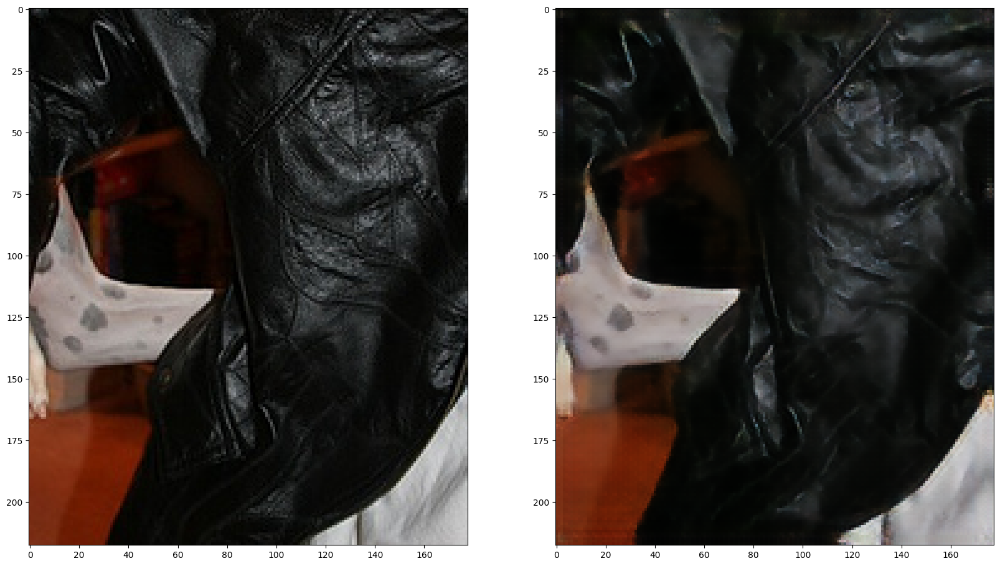

[4/5][0/2543]	Loss_D: 1.3851	Loss_G: 1.0634	Loss_E: 1.0643	D(x): 0.4562	D(G(z)): 0.4504 / 0.4573


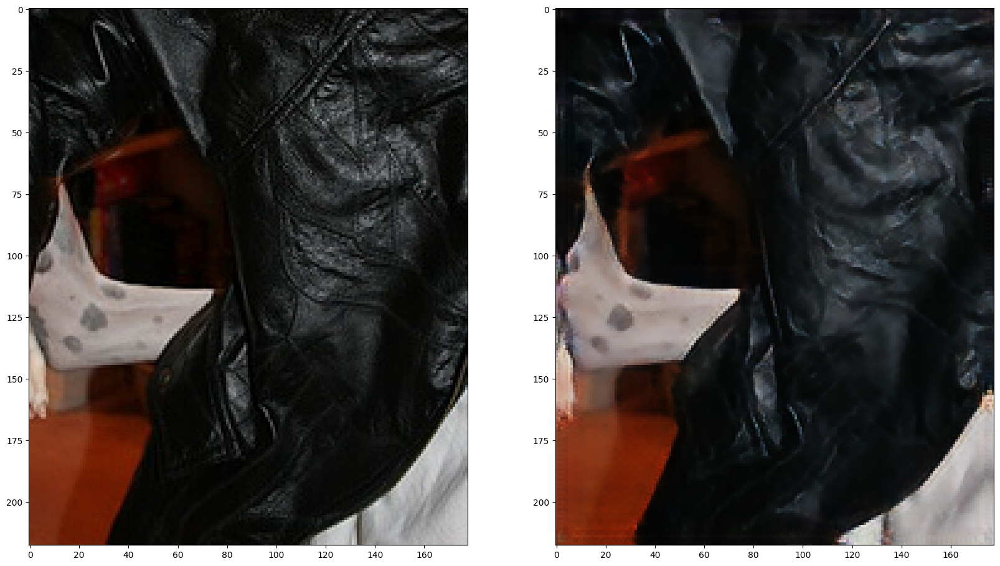

[4/5][50/2543]	Loss_D: 1.3539	Loss_G: 1.0112	Loss_E: 1.0107	D(x): 0.5184	D(G(z)): 0.4963 / 0.5036
[4/5][100/2543]	Loss_D: 1.3786	Loss_G: 1.1049	Loss_E: 1.1131	D(x): 0.5233	D(G(z)): 0.5088 / 0.5064
[4/5][150/2543]	Loss_D: 1.3736	Loss_G: 1.0857	Loss_E: 1.0745	D(x): 0.5273	D(G(z)): 0.5159 / 0.4936
[4/5][200/2543]	Loss_D: 1.3486	Loss_G: 0.9661	Loss_E: 0.9621	D(x): 0.5234	D(G(z)): 0.5005 / 0.5168
[4/5][250/2543]	Loss_D: 1.3838	Loss_G: 1.1242	Loss_E: 1.1242	D(x): 0.4865	D(G(z)): 0.4827 / 0.4879
[4/5][300/2543]	Loss_D: 1.3703	Loss_G: 0.9950	Loss_E: 0.9882	D(x): 0.5071	D(G(z)): 0.4954 / 0.4893
[4/5][350/2543]	Loss_D: 1.3720	Loss_G: 1.0832	Loss_E: 1.0815	D(x): 0.5355	D(G(z)): 0.5189 / 0.4814
[4/5][400/2543]	Loss_D: 1.3515	Loss_G: 0.9836	Loss_E: 1.0033	D(x): 0.5115	D(G(z)): 0.4882 / 0.5008
[4/5][450/2543]	Loss_D: 1.4080	Loss_G: 1.0372	Loss_E: 1.0399	D(x): 0.4717	D(G(z)): 0.4805 / 0.4790
[4/5][500/2543]	Loss_D: 1.3784	Loss_G: 1.0616	Loss_E: 1.0658	D(x): 0.5378	D(G(z)): 0.5282 / 0.5140


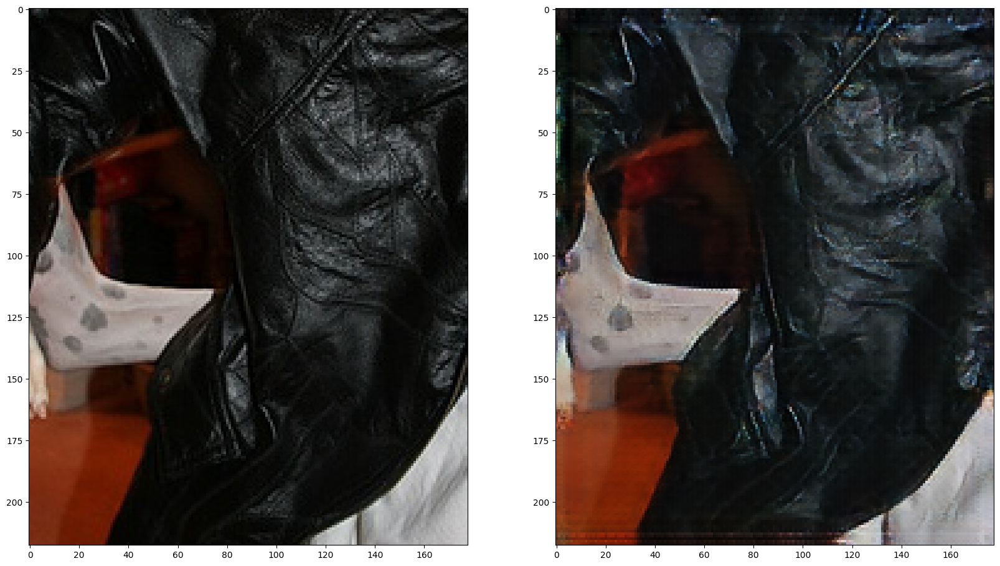

[4/5][550/2543]	Loss_D: 1.4526	Loss_G: 1.2041	Loss_E: 1.1980	D(x): 0.5030	D(G(z)): 0.5349 / 0.5038
[4/5][600/2543]	Loss_D: 1.3746	Loss_G: 1.0108	Loss_E: 1.0186	D(x): 0.4827	D(G(z)): 0.4734 / 0.4870
[4/5][650/2543]	Loss_D: 1.4045	Loss_G: 1.0977	Loss_E: 1.1077	D(x): 0.4977	D(G(z)): 0.5019 / 0.4907
[4/5][700/2543]	Loss_D: 1.3986	Loss_G: 1.1240	Loss_E: 1.1336	D(x): 0.4787	D(G(z)): 0.4813 / 0.4758
[4/5][750/2543]	Loss_D: 1.4061	Loss_G: 1.1225	Loss_E: 1.1106	D(x): 0.4760	D(G(z)): 0.4848 / 0.4718
[4/5][800/2543]	Loss_D: 1.3615	Loss_G: 1.0526	Loss_E: 1.0526	D(x): 0.5189	D(G(z)): 0.5008 / 0.4936
[4/5][850/2543]	Loss_D: 1.3908	Loss_G: 1.0499	Loss_E: 1.0496	D(x): 0.4835	D(G(z)): 0.4822 / 0.4844
[4/5][900/2543]	Loss_D: 1.3936	Loss_G: 1.0127	Loss_E: 1.0213	D(x): 0.5068	D(G(z)): 0.5118 / 0.5107
[4/5][950/2543]	Loss_D: 1.3969	Loss_G: 1.1340	Loss_E: 1.1421	D(x): 0.5073	D(G(z)): 0.5102 / 0.4676
[4/5][1000/2543]	Loss_D: 1.3861	Loss_G: 1.1036	Loss_E: 1.1058	D(x): 0.4854	D(G(z)): 0.4817 / 0.4703


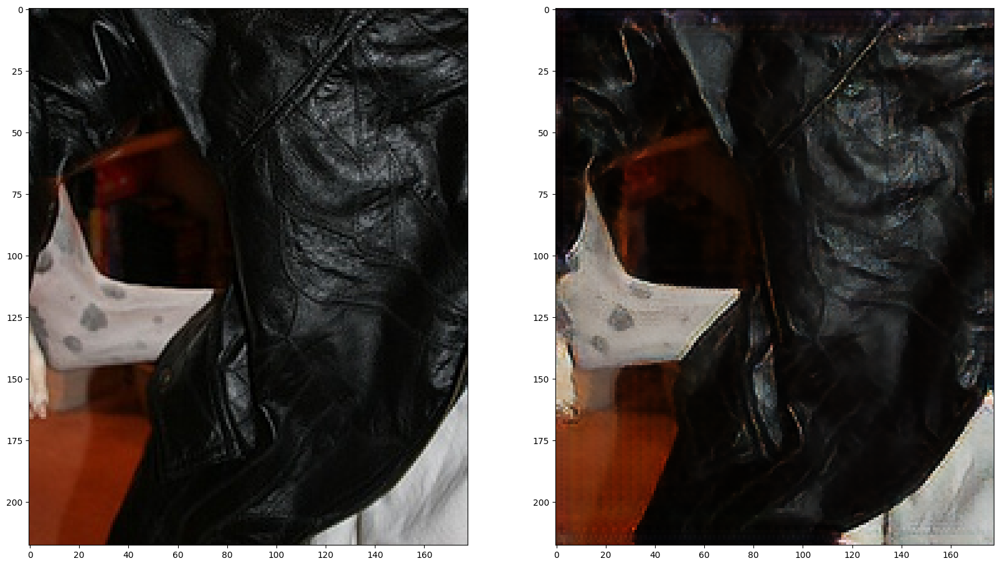

[4/5][1050/2543]	Loss_D: 1.3643	Loss_G: 1.0884	Loss_E: 1.0859	D(x): 0.5519	D(G(z)): 0.5330 / 0.5254
[4/5][1100/2543]	Loss_D: 1.4210	Loss_G: 1.1667	Loss_E: 1.1629	D(x): 0.5296	D(G(z)): 0.5451 / 0.5250
[4/5][1150/2543]	Loss_D: 1.3803	Loss_G: 1.1281	Loss_E: 1.1263	D(x): 0.4954	D(G(z)): 0.4913 / 0.4809
[4/5][1200/2543]	Loss_D: 1.3635	Loss_G: 1.1112	Loss_E: 1.1101	D(x): 0.5076	D(G(z)): 0.4916 / 0.4850
[4/5][1250/2543]	Loss_D: 1.3633	Loss_G: 0.9979	Loss_E: 1.0058	D(x): 0.5401	D(G(z)): 0.5202 / 0.5093
[4/5][1300/2543]	Loss_D: 1.3494	Loss_G: 1.0237	Loss_E: 1.0282	D(x): 0.4927	D(G(z)): 0.4712 / 0.4797
[4/5][1350/2543]	Loss_D: 1.3822	Loss_G: 1.1143	Loss_E: 1.0987	D(x): 0.4697	D(G(z)): 0.4625 / 0.4652
[4/5][1400/2543]	Loss_D: 1.3481	Loss_G: 1.1155	Loss_E: 1.1143	D(x): 0.5451	D(G(z)): 0.5156 / 0.4948
[4/5][1450/2543]	Loss_D: 1.3637	Loss_G: 1.0523	Loss_E: 1.0514	D(x): 0.4919	D(G(z)): 0.4755 / 0.4803
[4/5][1500/2543]	Loss_D: 1.3612	Loss_G: 1.1502	Loss_E: 1.1495	D(x): 0.5445	D(G(z)): 0.5232 / 0.4650


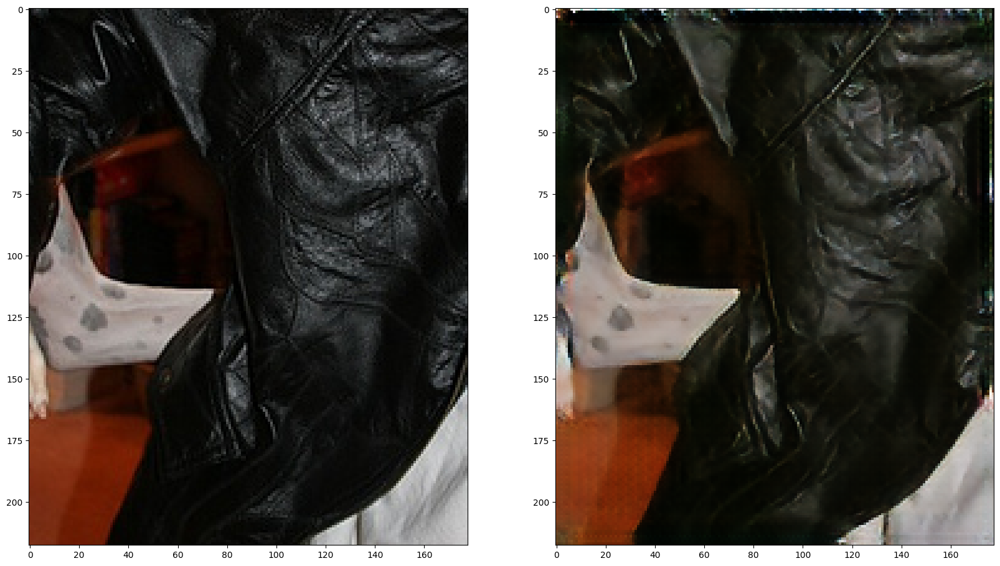

[4/5][1550/2543]	Loss_D: 1.4006	Loss_G: 1.0736	Loss_E: 1.0787	D(x): 0.4578	D(G(z)): 0.4623 / 0.4635
[4/5][1600/2543]	Loss_D: 1.3802	Loss_G: 1.1466	Loss_E: 1.1575	D(x): 0.4922	D(G(z)): 0.4853 / 0.4865
[4/5][1650/2543]	Loss_D: 1.3758	Loss_G: 1.1492	Loss_E: 1.1395	D(x): 0.4651	D(G(z)): 0.4481 / 0.4628
[4/5][1700/2543]	Loss_D: 1.3851	Loss_G: 1.0004	Loss_E: 1.0067	D(x): 0.5314	D(G(z)): 0.5241 / 0.5176
[4/5][1750/2543]	Loss_D: 1.4056	Loss_G: 1.0968	Loss_E: 1.0919	D(x): 0.5415	D(G(z)): 0.5441 / 0.4851
[4/5][1800/2543]	Loss_D: 1.4153	Loss_G: 1.0233	Loss_E: 1.0174	D(x): 0.5541	D(G(z)): 0.5556 / 0.5150
[4/5][1850/2543]	Loss_D: 1.4005	Loss_G: 1.1872	Loss_E: 1.1856	D(x): 0.4855	D(G(z)): 0.4860 / 0.4700
[4/5][1900/2543]	Loss_D: 1.4194	Loss_G: 1.1240	Loss_E: 1.1121	D(x): 0.5721	D(G(z)): 0.5751 / 0.5446
[4/5][1950/2543]	Loss_D: 1.3755	Loss_G: 1.1160	Loss_E: 1.1120	D(x): 0.4781	D(G(z)): 0.4659 / 0.4632
[4/5][2000/2543]	Loss_D: 1.3748	Loss_G: 1.0519	Loss_E: 1.0591	D(x): 0.4847	D(G(z)): 0.4764 / 0.4771


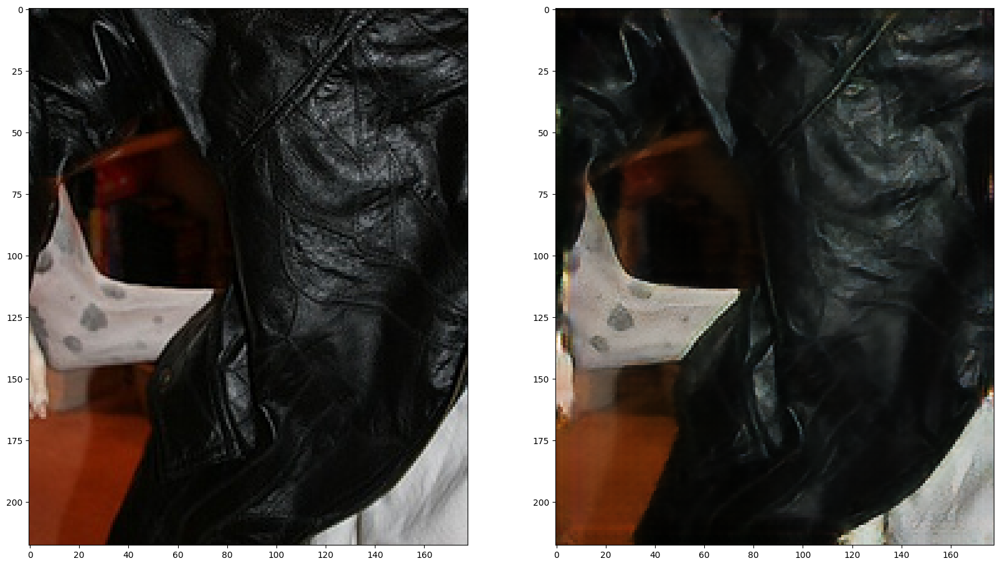

[4/5][2050/2543]	Loss_D: 1.3702	Loss_G: 1.0573	Loss_E: 1.0521	D(x): 0.5129	D(G(z)): 0.5024 / 0.4961
[4/5][2100/2543]	Loss_D: 1.3378	Loss_G: 1.0833	Loss_E: 1.0845	D(x): 0.5121	D(G(z)): 0.4826 / 0.4932
[4/5][2150/2543]	Loss_D: 1.3955	Loss_G: 1.0662	Loss_E: 1.0686	D(x): 0.5165	D(G(z)): 0.5139 / 0.4791
[4/5][2200/2543]	Loss_D: 1.3708	Loss_G: 0.9815	Loss_E: 0.9815	D(x): 0.5298	D(G(z)): 0.5141 / 0.5035
[4/5][2250/2543]	Loss_D: 1.3901	Loss_G: 1.0621	Loss_E: 1.0576	D(x): 0.4880	D(G(z)): 0.4889 / 0.4782
[4/5][2300/2543]	Loss_D: 1.3734	Loss_G: 1.1158	Loss_E: 1.1163	D(x): 0.4835	D(G(z)): 0.4730 / 0.4637
[4/5][2350/2543]	Loss_D: 1.3652	Loss_G: 1.1184	Loss_E: 1.1119	D(x): 0.4913	D(G(z)): 0.4753 / 0.4701
[4/5][2400/2543]	Loss_D: 1.3816	Loss_G: 1.0504	Loss_E: 1.0479	D(x): 0.5325	D(G(z)): 0.5279 / 0.4922
[4/5][2450/2543]	Loss_D: 1.3859	Loss_G: 1.1156	Loss_E: 1.1179	D(x): 0.4744	D(G(z)): 0.4676 / 0.4655
[4/5][2500/2543]	Loss_D: 1.3988	Loss_G: 1.0558	Loss_E: 1.0434	D(x): 0.5286	D(G(z)): 0.5306 / 0.5213


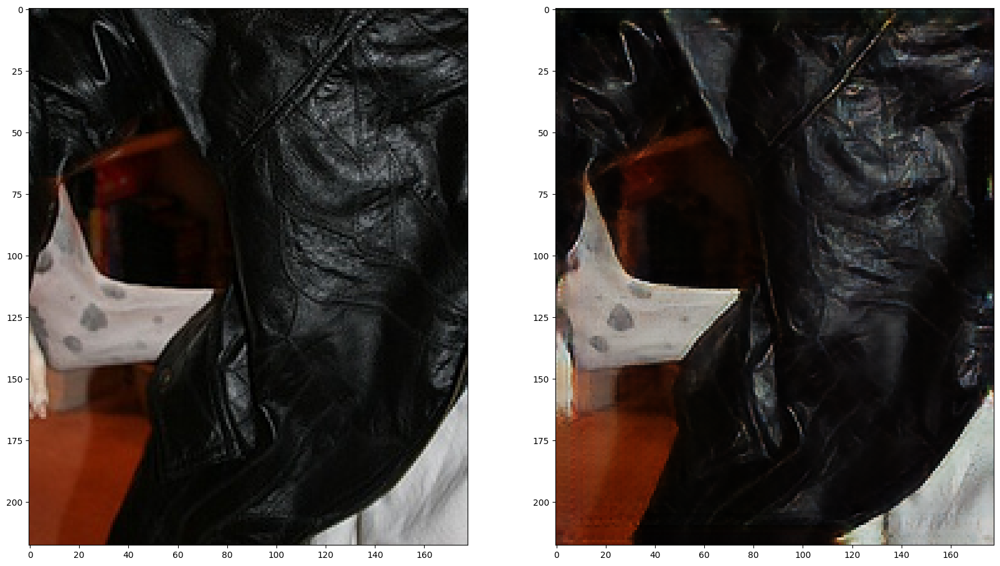

In [ ]:
# Training Loop

# Lists to keep track of progress
G_losses = []
D_losses = []
E_losses = []
iters = 0
num_epochs = 5

print("Starting Training Loop...")
# For each epoch
for epoch in range(num_epochs):
    # For each batch in the dataloader
    for i, (images) in enumerate(dataloader, 0):
        netG.train()
        netD.train()
        netE.train()
        
        netD.zero_grad()
        
        images = images.to(device)
        fake_images = netG(netE(images))

        # (1) Update D network: maximize the Gradient
        
        ## Create a fake pair batch --

        inp_x = {}
        inp_x['img']=images
        inp_x['encoded'] = netE(images)
        
        label = torch.FloatTensor(np.random.uniform(low=0.855, high=0.999, size=(images.size(0)))).to(device)
        output = netD(inp_x).view(-1)
        errD_real = criterion(output, label)
        errD_real.backward(retain_graph=True)
        D_x = output.mean().item()
        
        inp_x_fake = {}
        inp_x_fake['img']=fake_images
        inp_x_fake['encoded'] = netE(images)
        label = torch.FloatTensor(np.random.uniform(low=0.005, high=0.155, size=(images.size(0)))).to(device)
        output = netD(inp_x_fake).view(-1)
        errD_fake = criterion(output, label)
        errD_fake.backward(retain_graph=True)
        D_G_z1 = output.mean().item()
        
        errD = errD_real + errD_fake
        
        optimizerD.step()

        # (2) Update G network: maximize log(D(G(z)))
        netG.zero_grad()
        inp_x_fake = {}
        inp_x_fake['img']=fake_images
        inp_x_fake['encoded'] = netE(images)
        
        label = torch.FloatTensor(np.random.uniform(low=0.895, high=0.999, size=(images.size(0)))).to(device)
        output = netD(inp_x_fake).view(-1)
        
        errG = criterion(output, label) + 4*l1criterion(images,fake_images)
        errG.backward(retain_graph=True)
        D_G_z2 = output.mean().item()
        optimizerG.step()

        
        netE.zero_grad()
        inp_x_fake = {}
        inp_x_fake['img']=fake_images
        inp_x_fake['encoded'] = netE(images)
        
        label = torch.FloatTensor(np.random.uniform(low=0.895, high=0.999, size=(images.size(0)))).to(device)
        output = netD(inp_x_fake).view(-1)

        errE = criterion(output, label) + 4*l1criterion(images,fake_images)
        errE.backward(retain_graph=True)
        E_G_z2 = output.mean().item()
        optimizerE.step()
        
        STATS
        # Output training stats
        if i % 50 == 0:
            print('[%d/%d][%d/%d]\tLoss_D: %.4f\tLoss_G: %.4f\tLoss_E: %.4f\tD(x): %.4f\tD(G(z)): %.4f / %.4f'
                  % (epoch, num_epochs, i, len(dataloader),
                     errD.item(), errG.item(),errE.item(), D_x, D_G_z1, D_G_z2))

        # Save Losses for plotting later
        G_losses.append(errG.item())
        D_losses.append(errD.item())
        E_losses.append(errE.item())
        
        # Check how the generator is doing by saving G's output on fixed_noise

        del images
        del inp_x_fake
        del inp_x
        del label
        del output
        torch.cuda.empty_cache()
        iters += 1
        
        
        # Plot images for every 500 iterations
        if i%500 ==0:
            netE.eval()
            netG.eval()
            encoded_img = netE(valid_batch)
            reconstructed_img = netG(encoded_img)
            f, axarr = plt.subplots(num_images_to_show,2)
            for i in range(num_images_to_show):
                validimg = (valid_batch[i].cpu().detach().permute(1, 2, 0) * 0.5) + 0.5
                rec_img = (reconstructed_img[i].cpu().detach().permute(1, 2, 0) *0.5 ) + 0.5
                axarr[0].imshow(validimg)
                axarr[1].imshow(rec_img)
                f.set_figheight(20)
                f.set_figwidth(20)
            plt.show()

In [ ]:
print("Evaluating the model ...")
netE.eval()
netG.eval()
tot_img_size = IMG_WIDTH * IMG_HEIGHT * 3

Evaluating the model ...


In [ ]:
valid_dataset = ImageData(is_train=False)
batch_size=20
valid_dataloader = DataLoader(valid_dataset, batch_size=batch_size, shuffle=True)
valid_batch = next(iter(valid_dataloader)).to(device)

In [ ]:
print(valid_batch.shape)
encoded_img = netE(valid_batch)
print(encoded_img.shape)
reconstructed_img = netG(encoded_img)
print(reconstructed_img.shape)

torch.Size([20, 3, 218, 178])
torch.Size([20, 40, 54, 44])
torch.Size([20, 3, 218, 178])


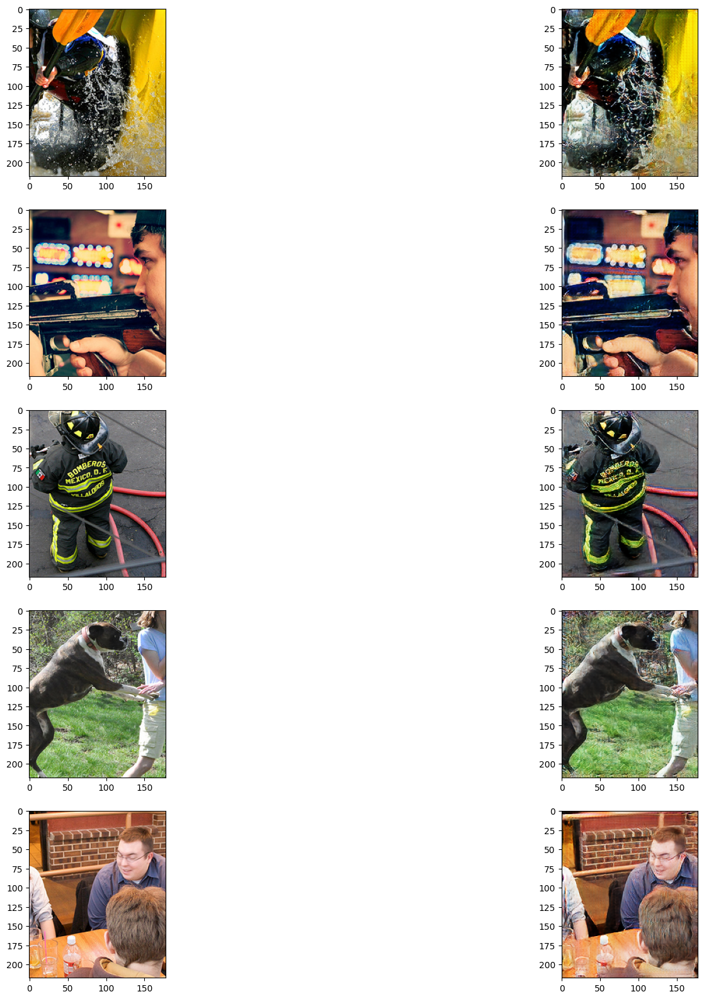

In [ ]:
num_images_to_show = 5
f, axarr = plt.subplots(num_images_to_show,2)
for i in range(num_images_to_show):
    validimg = (valid_batch[i].cpu().detach().permute(1, 2, 0) * 0.5) + 0.5
    rec_img = (reconstructed_img[i].cpu().detach().permute(1, 2, 0) *0.5) + 0.5
    axarr[i,0].imshow(validimg)
    axarr[i,1].imshow(rec_img)
    f.set_figheight(20)
    f.set_figwidth(20)
plt.show()

In [ ]:
torch.save(netE.state_dict(), "netE"+str(num_channels_in_encoder)+".model")
torch.save(netG.state_dict(), "netG"+str(num_channels_in_encoder)+".model")

In [ ]:
print("Total no. of iterations = ",len(E_losses))
print("Mean Encoder loss = ",np.mean(E_losses))
print("Mean Generator loss = ",np.mean(G_losses))
print("Mean Discriminator loss = ",np.mean(D_losses))

Total no. of iterations =  12715
Mean Encoder loss =  1.2346458487280043
Mean Generator loss =  1.2346787668474537
Mean Discriminator loss =  1.3721209124463118


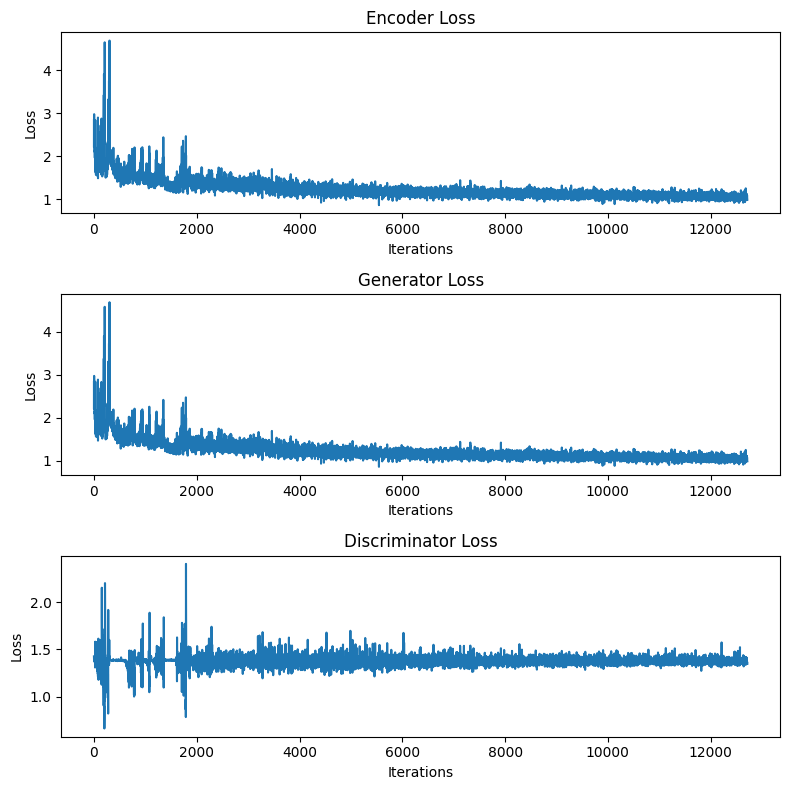

In [ ]:
fig, (ax1, ax2, ax3) = plt.subplots(3, 1, figsize=(8, 8))

ax1.plot(E_losses)
ax1.set_title('Encoder Loss')
ax1.set_xlabel('Iterations')
ax1.set_ylabel('Loss')

ax2.plot(G_losses)
ax2.set_title('Generator Loss')
ax2.set_xlabel('Iterations')
ax2.set_ylabel('Loss')

ax3.plot(D_losses)
ax3.set_title('Discriminator Loss')
ax3.set_xlabel('Iterations')
ax3.set_ylabel('Loss')


plt.tight_layout()
plt.show()